## Importación de librerías

In [2]:
# Tratamiento de datos
import pandas as pd

# Visualizaciones
import matplotlib.pyplot as plt
import seaborn as sns

# Configuración de ruta
import sys
sys.path.append('../')

# Importar funciones
from src.soporte import analisis_rapido, eda, matriz_correlacion

## Carga de datos

In [3]:
df = pd.read_csv("../data/output/basededatos_limpia.csv")

In [4]:
df.head()

,order_id,order_date,ship_date,ship_mode,customer_name,segment,state,country,market,region,...,quantity,discount,profit,shipping_cost,order_priority,year,admin_name,latitud,longitud,poblacion
0,AG-2011-2040,2011-01-01,2011-06-01,Standard Class,Toby Braunhardt,Consumer,constantine,algeria,Africa,Africa,...,2,0.0,106.140,35.46,Medium,2011,constantine,36.355089,6.664344,878977.0
1,IN-2011-47883,2011-01-01,2011-08-01,Standard Class,Joseph Holt,Consumer,new south wales,australia,APAC,Oceania,...,3,0.1,36.036,9.72,Medium,2011,new south wales,-32.646250,150.196007,6379411.0
2,HU-2011-1220,2011-01-01,2011-05-01,Second Class,Annie Thurman,Consumer,budapest,hungary,EMEA,EMEA,...,4,0.0,29.640,8.17,High,2011,budapest,47.498300,19.040800,1686222.0
3,IT-2011-3647632,2011-01-01,2011-05-01,Second Class,Eugene Moren,Home Office,stockholm,sweden,EU,North,...,3,0.5,-26.055,4.82,High,2011,stockholm,59.376200,18.033443,1652923.0
4,IN-2011-47883,2011-01-01,2011-08-01,Standard Class,Joseph Holt,Consumer,new south wales,australia,APAC,Oceania,...,5,0.1,37.770,4.70,Medium,2011,new south wales,-32.646250,150.196007,6379411.0


## Objetivos del análisis

* Identificar qué ciudades y países están asociados a un mayor volumen de ventas y rentabilidad, analizando variables como la ubicación geográfica, categoría de producto o tipo de cliente.

* Analizar cómo influyen factores comerciales (por ejemplo, descuentos, cantidad vendida, margen de beneficio, categoría de producto o segmento de mercado) en los resultados de ventas y en la rentabilidad general.

* Explorar patrones de comportamiento en las ventas a lo largo del tiempo y el territorio, detectando tendencias, estacionalidades y diferencias entre regiones, países o ciudades.

* Filtrar y centrar el análisis en registros consistentes y representativos, asegurando la calidad del conjunto de datos para evitar sesgos en las conclusiones y garantizar resultados fiables en los análisis posteriores.


## Análisis

In [5]:
def analisis_rapido(df, n=5):
    """ 
    Función que proporciona un análisis rápido del DataFrame.

    Parámetros:
    df: DataFrame
    n: Número de filas (por defecto = 5)
    """

    print(f"Las {n} primeras columnas son:")
    display(df.head(n))
    print("Información básica del DataFrame:")
    display(df.info())

    print(f"El número de duplicados es: {df.duplicated().sum()}")
    display(df.isna().mean().round(4) * 100)

In [6]:
analisis_rapido(df, 3)

Las 3 primeras columnas son:


,order_id,order_date,ship_date,ship_mode,customer_name,segment,state,country,market,region,...,quantity,discount,profit,shipping_cost,order_priority,year,admin_name,latitud,longitud,poblacion
0,AG-2011-2040,2011-01-01,2011-06-01,Standard Class,Toby Braunhardt,Consumer,constantine,algeria,Africa,Africa,...,2,0.0,106.140,35.46,Medium,2011,constantine,36.355089,6.664344,878977.0
1,IN-2011-47883,2011-01-01,2011-08-01,Standard Class,Joseph Holt,Consumer,new south wales,australia,APAC,Oceania,...,3,0.1,36.036,9.72,Medium,2011,new south wales,-32.646250,150.196007,6379411.0
2,HU-2011-1220,2011-01-01,2011-05-01,Second Class,Annie Thurman,Consumer,budapest,hungary,EMEA,EMEA,...,4,0.0,29.640,8.17,High,2011,budapest,47.498300,19.040800,1686222.0


Información básica del DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51290 entries, 0 to 51289
Data columns (total 25 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   order_id        51290 non-null  object 
 1   order_date      20067 non-null  object 
 2   ship_date       19834 non-null  object 
 3   ship_mode       51290 non-null  object 
 4   customer_name   51290 non-null  object 
 5   segment         51290 non-null  object 
 6   state           51290 non-null  object 
 7   country         51290 non-null  object 
 8   market          51290 non-null  object 
 9   region          51290 non-null  object 
 10  product_id      51290 non-null  object 
 11  category        51290 non-null  object 
 12  sub_category    51290 non-null  object 
 13  product_name    51290 non-null  object 
 14  sales           51290 non-null  float64
 15  quantity        51290 non-null  int64  
 16  discount        51290 non-null  float64
 1

None

El número de duplicados es: 0


order_id           0.00
order_date        60.88
ship_date         61.33
ship_mode          0.00
customer_name      0.00
segment            0.00
state              0.00
country            0.00
market             0.00
region             0.00
product_id         0.00
category           0.00
sub_category       0.00
product_name       0.00
sales              0.00
quantity           0.00
discount           0.00
profit             0.00
shipping_cost      0.00
order_priority     0.00
year               0.00
admin_name         0.00
latitud            0.00
longitud           0.00
poblacion          0.00
dtype: float64

No tenemos duplicados ya que está limpia la BD.

### Columnas del dataset

● ``order_id``: Identificador único del pedido realizado.

● ``order_date``: Fecha en la que se realizó el pedido.

● ``ship_date``: Fecha en la que el pedido fue enviado al cliente.

● ``ship_mode``: Tipo de envío utilizado (por ejemplo: entrega estándar, rápida o el mismo día).

● ``customer_name``: Nombre del cliente que realizó la compra.

● ``segment``: Segmento de mercado al que pertenece el cliente (por ejemplo: consumidor, empresa, hogar).

● ``state``: Estado o provincia donde se realizó el pedido.

● ``country``: País donde se encuentra el cliente o se registró la venta.

● ``market``: Región comercial global (por ejemplo: Asia Pacífico, Europa, América Latina, etc.).

● ``region``: Subdivisión geográfica dentro del mercado (por ejemplo: norte, sur, centro).

● ``product_id``: Identificador único del producto vendido.

● ``category``: Categoría general del producto (por ejemplo: Tecnología, Muebles, Suministros de oficina).

● ``sub_category``: Subcategoría del producto (por ejemplo: Sillas, Teléfonos, Papel).

● ``product_name``: Nombre o descripción del producto.

● ``sales``: Valor total de las ventas de ese pedido (importe monetario).

● ``quantity``: Cantidad de unidades del producto vendidas.

● ``discount``: Descuento aplicado al producto en esa venta (en proporción, entre 0 y 1).

● ``profit``: Beneficio neto obtenido por la venta del producto (ventas menos costes).

● ``shipping_cost``: Coste del envío asociado al pedido.

● ``order_priority``: Nivel de prioridad asignado al pedido (por ejemplo: alta, media, baja).

● ``year``: Año en que se realizó el pedido.

● ``admin_name``: Nombre administrativo de la división territorial (estado o provincia).

● ``latitud``: Coordenada geográfica de latitud correspondiente al lugar del pedido.

● ``longitud``: Coordenada geográfica de longitud correspondiente al lugar del pedido.

● ``poblacion``: Población estimada de la ciudad o región donde se realizó el pedido.

## EDA

Variables numéricas:

 Index(['sales', 'quantity', 'discount', 'profit', 'shipping_cost', 'year',
       'latitud', 'longitud', 'poblacion'],
      dtype='object')

Variables categóricas:

 Index(['order_id', 'order_date', 'ship_date', 'ship_mode', 'customer_name',
       'segment', 'state', 'country', 'market', 'region', 'product_id',
       'category', 'sub_category', 'product_name', 'order_priority',
       'admin_name'],
      dtype='object')
Veamos las estadísticas básicas:



,count,mean,std,min,25%,50%,75%,max
sales,51290.0,152.76,199.06,0.00,24.00,68.00,196.00,9.990000e+02
quantity,51290.0,3.48,2.28,1.00,2.00,3.00,5.00,1.400000e+01
discount,51290.0,0.14,0.21,0.00,0.00,0.00,0.20,8.500000e-01
profit,51290.0,28.64,174.42,-6599.98,0.00,9.24,36.81,8.399980e+03
shipping_cost,51290.0,26.38,57.30,0.00,2.61,7.79,24.45,9.335700e+02
year,51290.0,2012.78,1.10,2011.00,2012.00,2013.00,2014.00,2.014000e+03
latitud,51290.0,24.22,24.96,-46.23,13.30,31.14,41.83,6.204000e+01
longitud,51290.0,-4.45,80.51,-122.54,-79.52,2.35,43.51,1.780200e+02
poblacion,51290.0,22747452.70,36323856.20,0.00,2942036.00,9944450.00,32217896.00,1.360846e+09


,count,unique,top,freq
order_id,51290,25035,CA-2014-100111,14
order_date,20067,565,2014-03-09,126
ship_date,19834,580,2014-07-09,115
ship_mode,51290,4,Standard Class,30775
customer_name,51290,795,Muhammed Yedwab,108
segment,51290,3,Consumer,26518
state,51290,1093,california,2001
country,51290,147,united states,9994
market,51290,7,APAC,11002
region,51290,13,Central,11117


 
---------- ESTAMOS ANALIZANDO LA COLUMNA: 'order_id' ----------
Valores únicos: ['AG-2011-2040' 'IN-2011-47883' 'HU-2011-1220' ... 'MX-2014-108574'
 'MO-2014-2560' 'CA-2014-156720']

Frecuencia de los valores únicos de las categorías


order_id
CA-2014-100111     14
TO-2014-9950       13
IN-2012-41261      13
MX-2014-166541     13
NI-2014-8880       13
                   ..
ES-2014-2815584     1
IN-2014-78228       1
MX-2014-122511      1
OD-2014-9490        1
ES-2011-4869686     1
Name: count, Length: 25035, dtype: int64

 
---------- ESTAMOS ANALIZANDO LA COLUMNA: 'order_date' ----------
Valores únicos: ['2011-01-01' '2011-02-01' '2011-03-01' '2011-04-01' '2011-05-01'
 '2011-06-01' '2011-07-01' '2011-08-01' '2011-09-01' '2011-10-01'
 '2011-11-01' '2011-12-01' nan '2011-01-02' '2011-02-02' '2011-03-02'
 '2011-04-02' '2011-05-02' '2011-06-02' '2011-07-02' '2011-08-02'
 '2011-09-02' '2011-10-02' '2011-11-02' '2011-12-02' '2011-01-03'
 '2011-02-03' '2011-03-03' '2011-04-03' '2011-05-03' '2011-06-03'
 '2011-07-03' '2011-08-03' '2011-09-03' '2011-10-03' '2011-11-03'
 '2011-12-03' '2011-01-04' '2011-02-04' '2011-03-04' '2011-04-04'
 '2011-05-04' '2011-06-04' '2011-07-04' '2011-08-04' '2011-09-04'
 '2011-11-04' '2011-12-04' '2011-02-05' '2011-03-05' '2011-04-05'
 '2011-05-05' '2011-06-05' '2011-07-05' '2011-08-05' '2011-09-05'
 '2011-10-05' '2011-11-05' '2011-12-05' '2011-01-06' '2011-02-06'
 '2011-03-06' '2011-04-06' '2011-05-06' '2011-06-06' '2011-07-06'
 '2011-08-06' '2011-09-06' '2011-10-06' '2011-11-06' '

order_date
2014-03-09    126
2014-10-12    114
2014-12-11    103
2013-11-11    102
2014-03-12    101
             ... 
2011-06-02      1
2014-09-02      1
2012-11-03      1
2011-07-08      1
2011-02-01      1
Name: count, Length: 565, dtype: int64

 
---------- ESTAMOS ANALIZANDO LA COLUMNA: 'ship_date' ----------
Valores únicos: ['2011-06-01' '2011-08-01' '2011-05-01' '2011-03-01' '2011-09-01'
 '2011-07-01' '2011-11-01' '2011-10-01' nan '2011-12-01' '2011-01-02'
 '2011-02-02' '2011-03-02' '2011-04-02' '2011-06-02' '2011-05-02'
 '2011-07-02' '2011-10-02' '2011-08-02' '2011-09-02' '2011-12-02'
 '2011-11-02' '2011-03-03' '2011-01-03' '2011-02-03' '2011-04-03'
 '2011-06-03' '2011-07-03' '2011-05-03' '2011-08-03' '2011-09-03'
 '2011-10-03' '2011-11-03' '2011-12-03' '2011-01-04' '2011-02-04'
 '2011-03-04' '2011-04-04' '2011-06-04' '2011-05-04' '2011-08-04'
 '2011-07-04' '2011-09-04' '2011-10-04' '2011-12-04' '2011-11-04'
 '2011-01-05' '2011-03-05' '2011-02-05' '2011-04-05' '2011-06-05'
 '2011-05-05' '2011-07-05' '2011-09-05' '2011-08-05' '2011-10-05'
 '2011-11-05' '2011-12-05' '2011-01-06' '2011-02-06' '2011-04-06'
 '2011-03-06' '2011-05-06' '2011-06-06' '2011-07-06' '2011-08-06'
 '2011-09-06' '2011-10-06' '2011-12-06' '2011-11-06' '2

ship_date
2014-07-09    115
2014-07-12    101
2013-01-07     93
2014-11-11     92
2014-05-12     88
             ... 
2011-08-02      4
2015-07-01      3
2011-03-01      2
2011-05-01      2
2011-06-01      2
Name: count, Length: 580, dtype: int64

 
---------- ESTAMOS ANALIZANDO LA COLUMNA: 'ship_mode' ----------
Valores únicos: ['Standard Class' 'Second Class' 'Same Day' 'First Class']

Frecuencia de los valores únicos de las categorías


ship_mode
Standard Class    30775
Second Class      10309
First Class        7505
Same Day           2701
Name: count, dtype: int64

 
---------- ESTAMOS ANALIZANDO LA COLUMNA: 'customer_name' ----------
Valores únicos: ['Toby Braunhardt' 'Joseph Holt' 'Annie Thurman' 'Eugene Moren'
 'Magdelene Morse' 'Kean Nguyen' 'Ken Lonsdale' 'Lindsay Williams'
 'Larry Blacks' 'Dorothy Dickinson' 'Dennis Pardue' 'Stewart Visinsky'
 "Jas O'Carroll" 'Chris McAfee' 'Nat Gilpin' 'Jack Garza'
 'Russell Applegate' 'Maya Herman' 'Beth Thompson' 'Arthur Prichep'
 'Arthur Wiediger' 'Grant Thornton' 'Darren Powers' 'Bradley Drucker'
 'Jasper Cacioppo' 'Jennifer Halladay' 'Michael Granlund' 'Phillina Ober'
 'Shaun Weien' 'Shahid Hopkins' 'Brosina Hoffman' 'Robert Dilbeck'
 'Grace Kelly' 'Khloe Miller' 'Mick Brown' 'Maria Etezadi'
 'Maribeth Schnelling' 'Dave Poirier' 'Harry Marie' 'Lycoris Saunders'
 'Alyssa Crouse' "Jack O'Briant" 'Adam Bellavance' 'Joy Smith'
 'Henia Zydlo' 'Nicole Fjeld' 'Christopher Martinez' 'Vivek Sundaresam'
 'Joe Elijah' 'Ed Braxton' 'Alejandro Grove' 'Sample Company A'
 'Dan Lawera' 'Elpida Rittenbach' 'Sanjit Jac

customer_name
Muhammed Yedwab    108
Steven Ward        106
Bill Eplett        102
Gary Hwang         102
Patrick O'Brill    102
                  ... 
Emily Burns         35
David Bremer        34
Darren Budd         31
Nicole Brennan      31
Michael Oakman      29
Name: count, Length: 795, dtype: int64

 
---------- ESTAMOS ANALIZANDO LA COLUMNA: 'segment' ----------
Valores únicos: ['Consumer' 'Home Office' 'Corporate']

Frecuencia de los valores únicos de las categorías


segment
Consumer       26518
Corporate      15429
Home Office     9343
Name: count, dtype: int64

 
---------- ESTAMOS ANALIZANDO LA COLUMNA: 'state' ----------
Valores únicos: ['constantine' 'new south wales' 'budapest' ... 'karaman' 'sikasso'
 'atsimo-andrefana']

Frecuencia de los valores únicos de las categorías


state
california           2001
england              1499
new york             1128
texas                 985
ile-de-france         981
                     ... 
edirne                  1
south chungcheong       1
setubal                 1
sikasso                 1
atsimo-andrefana        1
Name: count, Length: 1093, dtype: int64

 
---------- ESTAMOS ANALIZANDO LA COLUMNA: 'country' ----------
Valores únicos: ['algeria' 'australia' 'hungary' 'sweden' 'canada' 'new zealand' 'iraq'
 'philippines' 'united kingdom' 'malaysia' 'guatemala' 'iran' 'thailand'
 'tanzania' 'brazil' 'mexico' 'cuba' 'france' 'united states' 'japan'
 'sudan' 'taiwan' 'indonesia' 'vietnam' 'angola' 'china' 'mozambique'
 'lebanon' 'singapore' 'netherlands' 'nigeria' 'egypt' 'venezuela'
 'south africa' 'spain' 'india' 'turkey' 'austria' 'italy' 'germany'
 'nicaragua' 'dominican republic' 'el salvador' 'denmark' 'saudi arabia'
 'zambia' 'myanmar (burma)' 'russia' 'mongolia' 'belgium' 'kenya'
 'colombia' 'estonia' 'madagascar' 'portugal' 'morocco' 'sierra leone'
 'norway' 'central african republic' 'czech republic' 'benin' 'bangladesh'
 'panama' 'chile' 'south korea' 'switzerland' 'moldova' 'uganda'
 'zimbabwe' 'niger' 'senegal' 'hong kong'
 'democratic republic of the congo' 'poland' 'ireland' 'pakistan'
 'azerbaijan' 'ukraine' 'albania' 'roman

country
united states    9994
australia        2837
france           2827
mexico           2644
germany          2065
                 ... 
south sudan         2
swaziland           2
chad                2
eritrea             2
bahrain             2
Name: count, Length: 147, dtype: int64

 
---------- ESTAMOS ANALIZANDO LA COLUMNA: 'market' ----------
Valores únicos: ['Africa' 'APAC' 'EMEA' 'EU' 'Canada' 'LATAM' 'US']

Frecuencia de los valores únicos de las categorías


market
APAC      11002
LATAM     10294
EU        10000
US         9994
EMEA       5029
Africa     4587
Canada      384
Name: count, dtype: int64

 
---------- ESTAMOS ANALIZANDO LA COLUMNA: 'region' ----------
Valores únicos: ['Africa' 'Oceania' 'EMEA' 'North' 'Canada' 'Southeast Asia' 'Central'
 'South' 'Caribbean' 'North Asia' 'East' 'West' 'Central Asia']

Frecuencia de los valores únicos de las categorías


region
Central           11117
South              6645
EMEA               5029
North              4785
Africa             4587
Oceania            3487
West               3203
Southeast Asia     3129
East               2848
North Asia         2338
Central Asia       2048
Caribbean          1690
Canada              384
Name: count, dtype: int64

 
---------- ESTAMOS ANALIZANDO LA COLUMNA: 'product_id' ----------
Valores únicos: ['OFF-TEN-10000025' 'OFF-SU-10000618' 'OFF-TEN-10001585' ...
 'FUR-ELD-10001163' 'FUR-TA-10004504' 'FUR-TA-10002557']

Frecuencia de los valores únicos de las categorías


product_id
OFF-AR-10003651     35
OFF-AR-10003829     31
OFF-BI-10003708     30
OFF-BI-10002799     30
FUR-CH-10003354     28
                    ..
FUR-TA-10002650      1
OFF-LA-10000220      1
OFF-AP-10000534      1
FUR-TA-10003576      1
FUR-BEV-10001217     1
Name: count, Length: 10292, dtype: int64

 
---------- ESTAMOS ANALIZANDO LA COLUMNA: 'category' ----------
Valores únicos: ['Office Supplies' 'Furniture' 'Technology']

Frecuencia de los valores únicos de las categorías


category
Office Supplies    31273
Technology         10141
Furniture           9876
Name: count, dtype: int64

 
---------- ESTAMOS ANALIZANDO LA COLUMNA: 'sub_category' ----------
Valores únicos: ['Storage' 'Supplies' 'Paper' 'Furnishings' 'Machines' 'Appliances'
 'Copiers' 'Chairs' 'Tables' 'Bookcases' 'Phones' 'Accessories' 'Labels'
 'Art' 'Envelopes' 'Fasteners' 'Binders']

Frecuencia de los valores únicos de las categorías


sub_category
Binders        6152
Storage        5059
Art            4883
Paper          3538
Chairs         3434
Phones         3357
Furnishings    3170
Accessories    3075
Labels         2606
Envelopes      2435
Supplies       2425
Fasteners      2420
Bookcases      2411
Copiers        2223
Appliances     1755
Machines       1486
Tables          861
Name: count, dtype: int64

 
---------- ESTAMOS ANALIZANDO LA COLUMNA: 'product_name' ----------
Valores únicos: ['Tenex Lockers, Blue' 'Acme Trimmer, High Speed'
 'Tenex Box, Single Width' ...
 'Panasonic Business\xa0Telephones\xa0KX-T7736'
 'Bush Saratoga Collection 5-Shelf Bookcase, Hanover Cherry, *Special Order'
 'Acco Glide Clips']

Frecuencia de los valores únicos de las categorías


product_name
Staples                                                                      227
Cardinal Index Tab, Clear                                                     92
Eldon File Cart, Single Width                                                 90
Rogers File Cart, Single Width                                                84
Ibico Index Tab, Clear                                                        83
                                                                            ... 
Konica Minolta magicolor 1690MF Multifunction Printer                          1
Xerox 1901                                                                     1
Panasonic Business Telephones KX-T7736                                         1
Bush Saratoga Collection 5-Shelf Bookcase, Hanover Cherry, *Special Order      1
Acco Glide Clips                                                               1
Name: count, Length: 3788, dtype: int64

 
---------- ESTAMOS ANALIZANDO LA COLUMNA: 'order_priority' ----------
Valores únicos: ['Medium' 'High' 'Critical' 'Low']

Frecuencia de los valores únicos de las categorías


order_priority
Medium      29433
High        15501
Critical     3932
Low          2424
Name: count, dtype: int64

 
---------- ESTAMOS ANALIZANDO LA COLUMNA: 'admin_name' ----------
Valores únicos: ['constantine' 'new south wales' 'budapest' 'stockholm' 'ontario'
 'auckland' 'ninawa' 'philippines' 'united kingdom' 'sarawak' 'guatemala'
 'yazd' 'nakhon ratchasima' 'iran' 'dar es salaam' 'parana' 'yucatan'
 'granma' 'france' 'alagoas' 'santiago de cuba' 'texas' 'tottori'
 'khartoum' 'veracruz' 'illinois' 'taiwan' 'ile-de-france'
 'sumatera barat' 'vietnam' 'luanda' 'jilin' 'pennsylvania' 'kentucky'
 'niassa' 'lebanon' 'california' 'alger' 'sao paulo' 'georgia' 'singapore'
 'groningen' 'benguela' 'yunnan' 'lagos' 'jawa timur' 'kien giang'
 'queensland' 'al qahirah' 'carabobo' 'mexico' 'guangxi' 'south africa'
 'thailand' 'jawa barat' 'murcia' 'jammu and kashmir' 'bursa' 'otago'
 'austria' 'virginia' 'liguria' 'coahuila' 'lower saxony' 'delaware'
 'aswan' 'jalisco' 'netherlands' 'anzoategui' 'vastra gotaland'
 'south australia' 'louisiana' 'south carolina' 'esteli' 'baja california'
 'eastern cape' 'g

admin_name
california        2001
france            1730
united kingdom    1633
new york          1128
texas              985
                  ... 
isparta              1
kastamonu            1
paysandu             1
setubal              1
sikasso              1
Name: count, Length: 903, dtype: int64

Vayamos con los countplots:

Columna order_id tiene demasiadas categorías (25035)


Columna order_date tiene demasiadas categorías (565)


Columna ship_date tiene demasiadas categorías (580)




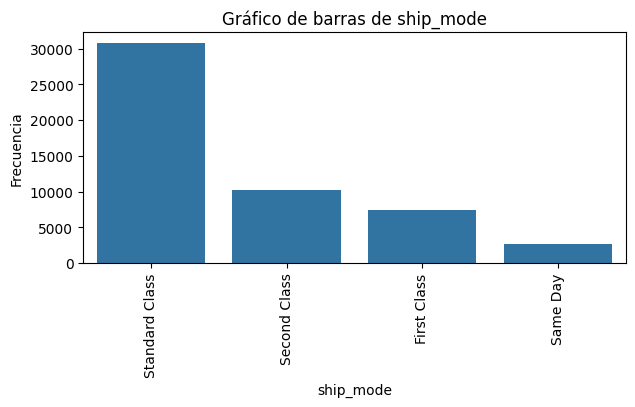

Columna customer_name tiene demasiadas categorías (795)




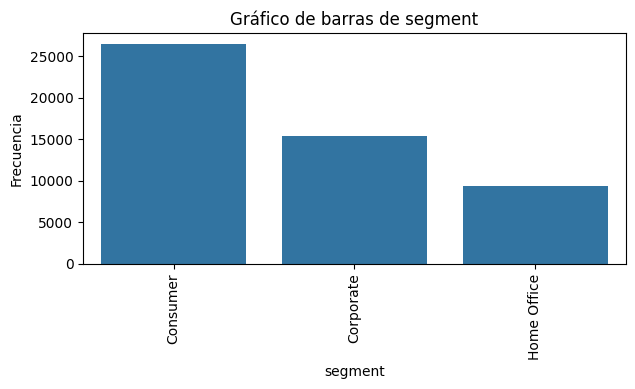

Columna state tiene demasiadas categorías (1093)




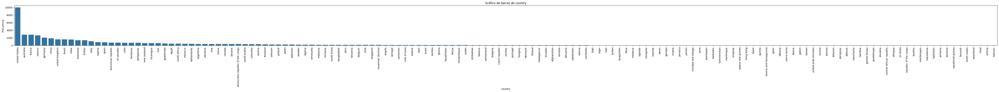

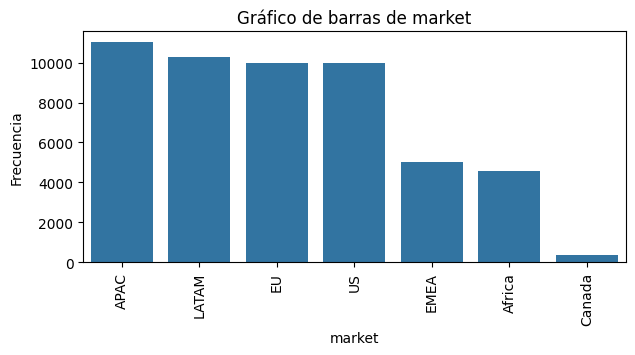

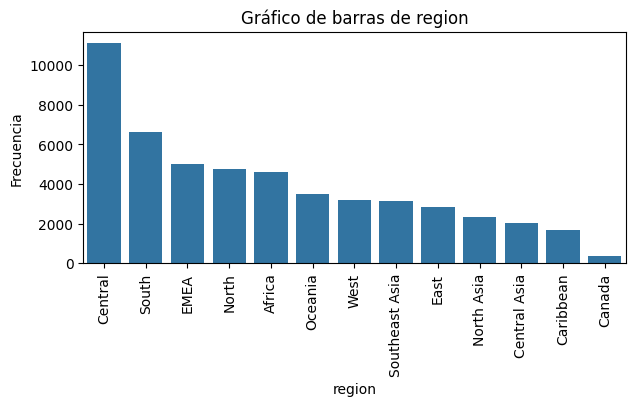

Columna product_id tiene demasiadas categorías (10292)




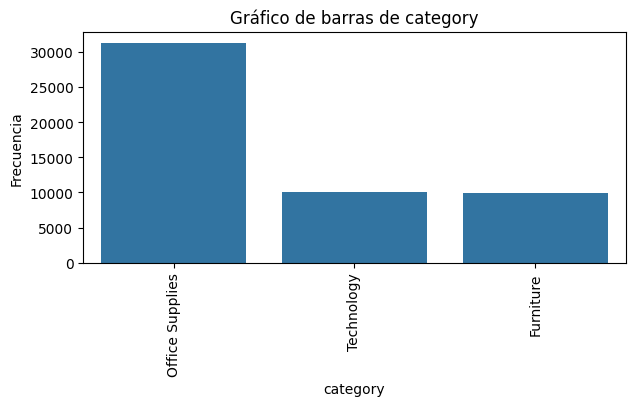

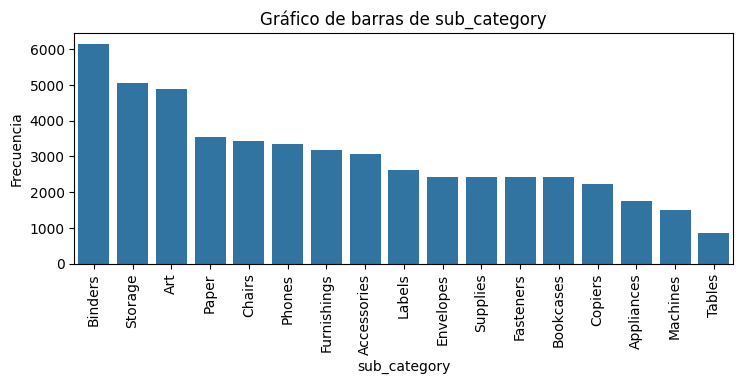

Columna product_name tiene demasiadas categorías (3788)




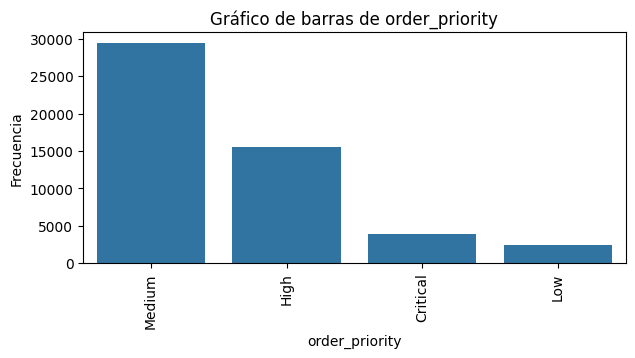

Columna admin_name tiene demasiadas categorías (903)


Vayamos con los histogramas:



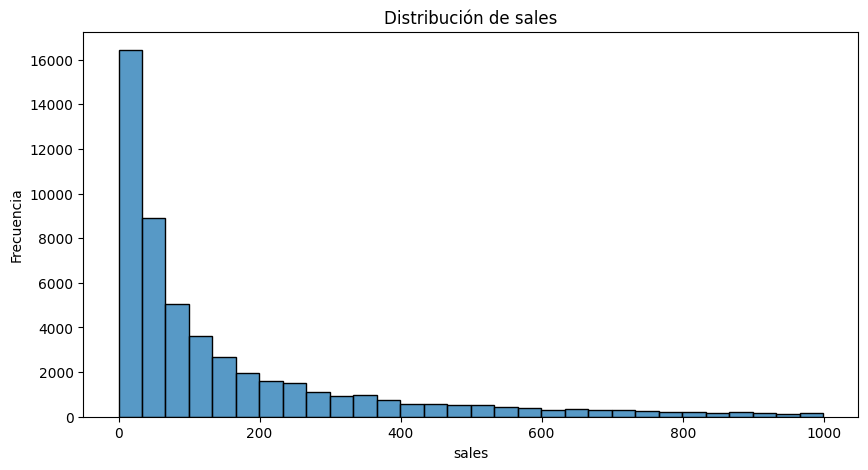

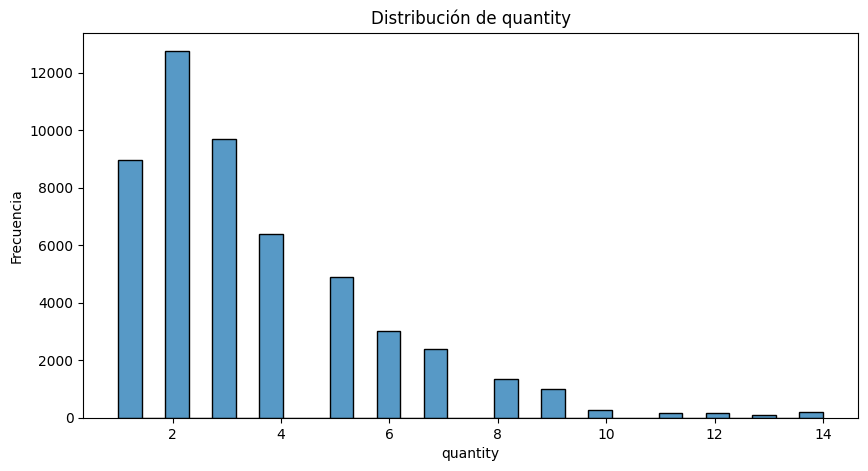

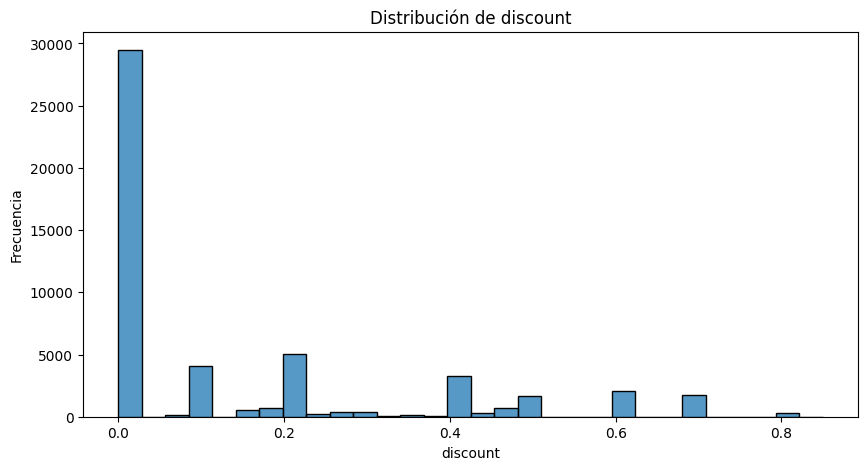

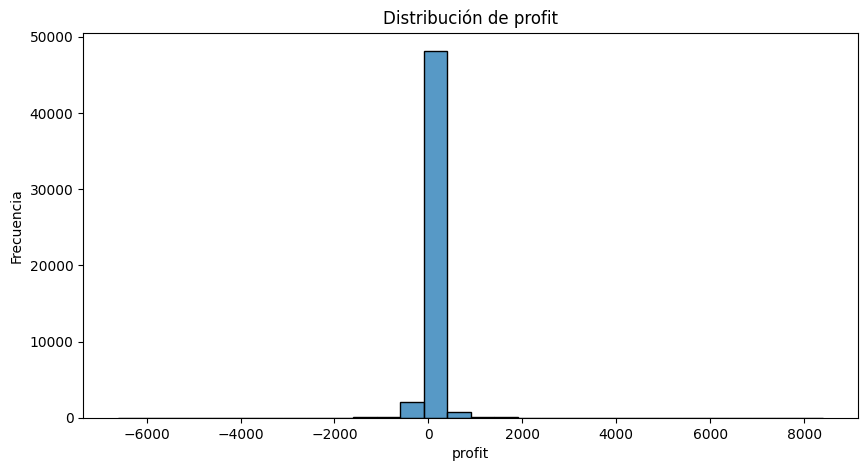

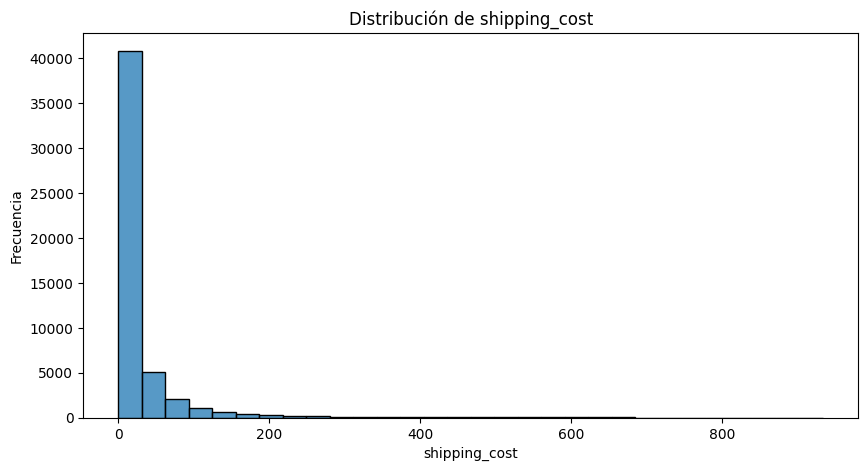

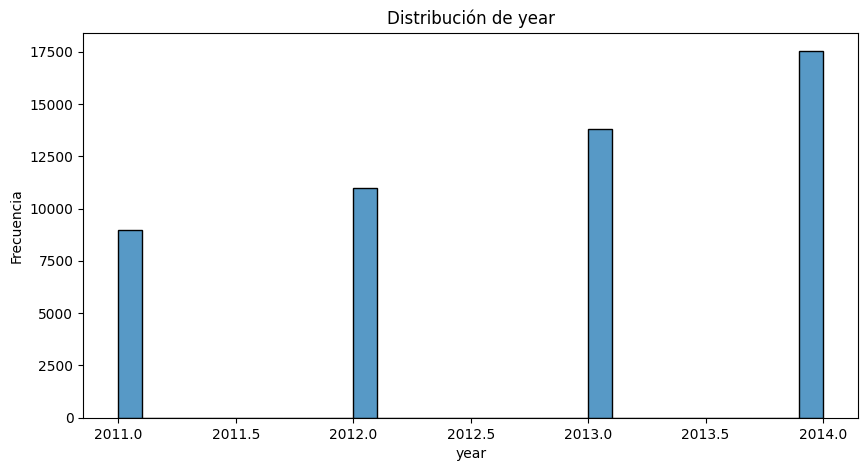

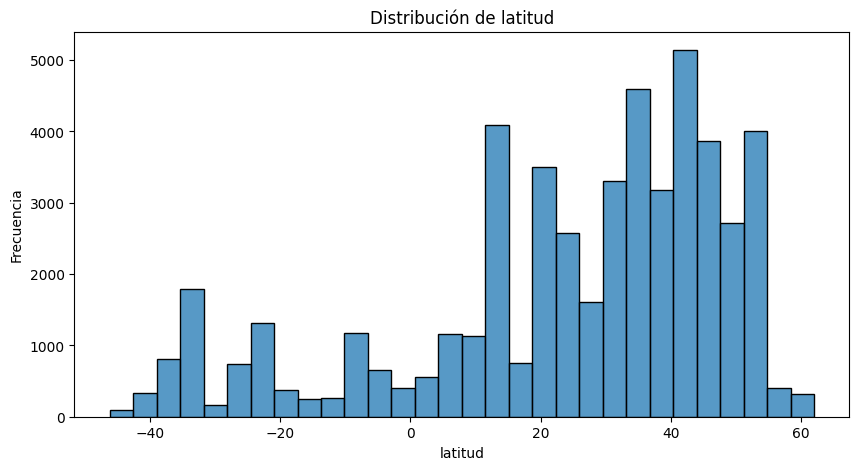

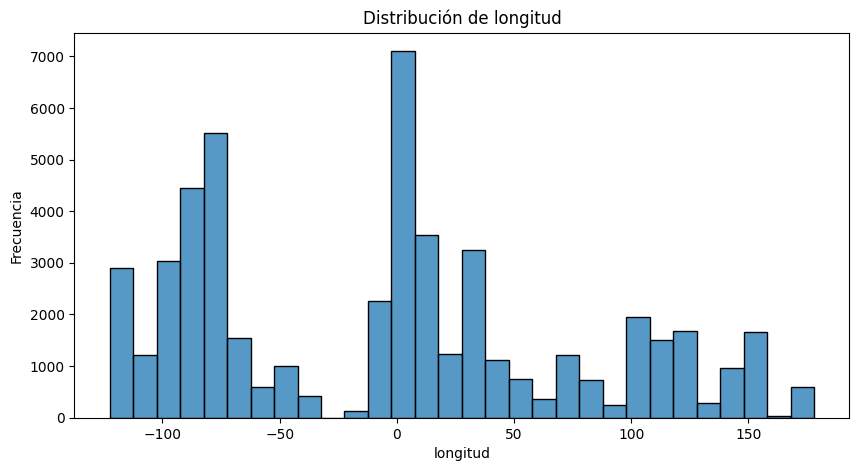

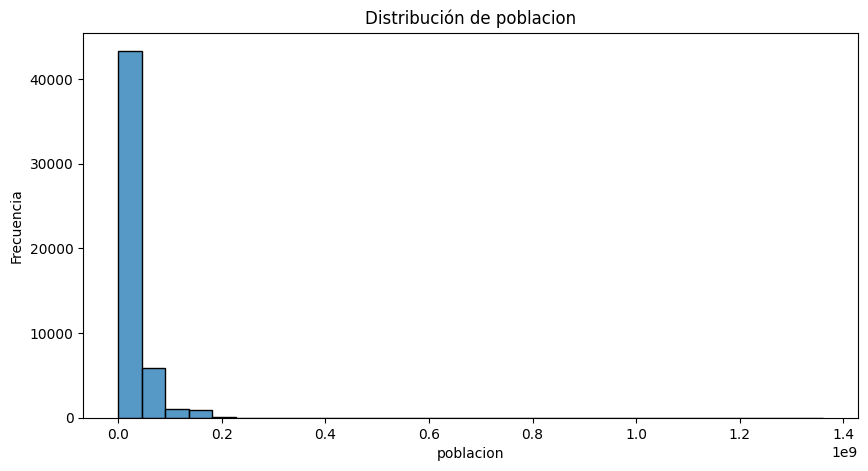

Vayamos con los boxplots:



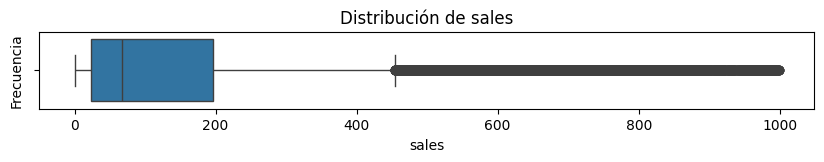

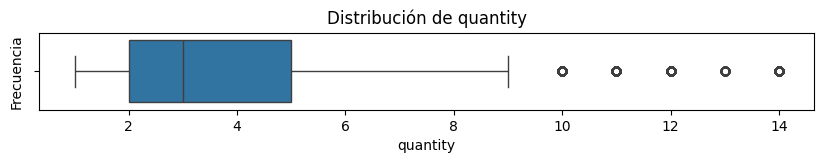

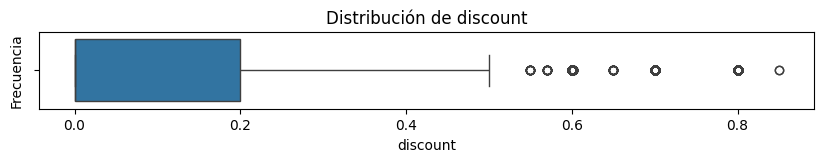

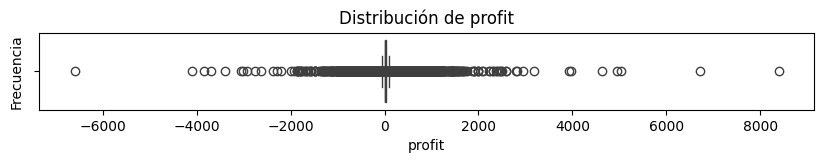

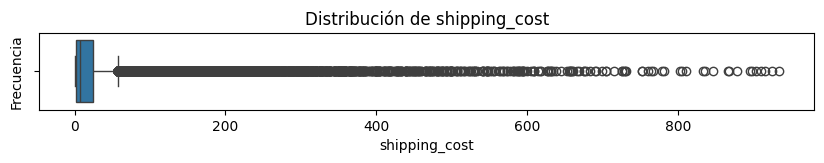

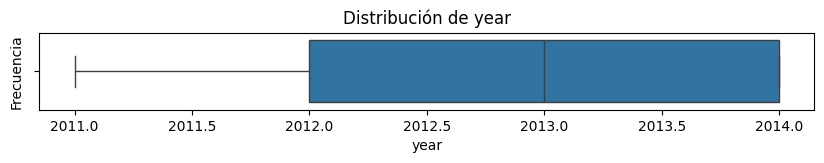

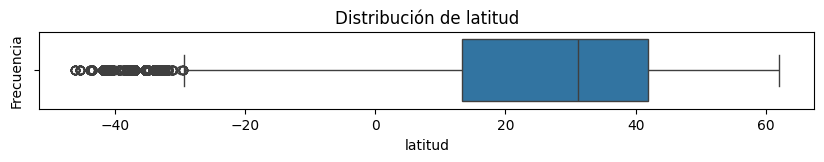

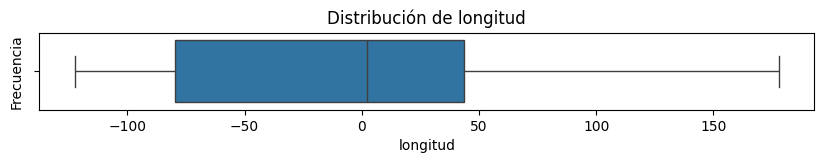

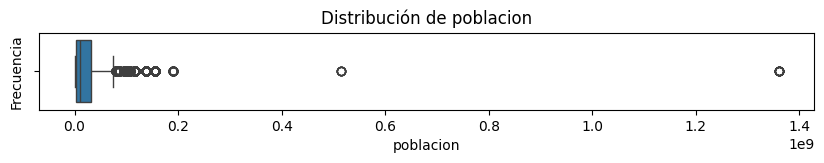

In [7]:
eda(df)

### Resumen EDA



Anotaciones antes de empezar a analizar:

Relación variables: mercado y región. Ejemplo: Mercado - África y Región - África. Y así con todas.

- Cuando es África - África.

- Cuando es APAC – Asia Central, Norte de Asia, Sur de Asia y Oceanía.

- Cuando es Canadá – Canadá.

- Cuando es EMEA (Europa, Oriente Medio y África) – EMEA.

- Cuando es EU – Central, Norte y Sur.

- Cuando es LATAM – Central, Norte, Sur y Caribe.

- Cuando es US – Central, Este, Oeste y Sur.

En la tabla resumen de las variables categóricas podemos observar los valores más frecuentes:

-	`order_id`: El identificador del pedido más frecuente es CA-2014-100111.

-	`order_date`: La fecha de pedido más frecuente es el 9 de marzo de 2014.

-	`ship_date`: La fecha de envío más frecuente es el 9 de julio de 2014.

-	`ship_mode`: El tipo de envío más utilizado es la entrega estándar.

-	`customer_name`: El nombre del cliente que más compras ha realizado es Muhammed Yedwab.

-	`segment`: El segmento de mercado al que pertenece el cliente más frecuente es el consumidor.

-	`state`: El estado desde donde se realizan más pedidos es California.

-	`country`: El país desde donde más pedidos se realizan es Estados Unidos.

-	`market`: La región comercial global más frecuente es APAC.

-	`region`: La subdivisión geográfica dentro del mercado más frecuente es Central.

-	`product_id`: El identificador de producto más frecuente es OFF-AR-10003651.

-	`category`: La categoría general del producto más frecuente es suministros de oficina.

-	`sub_category`: La subcategoría del producto más frecuente es la carpeta.

-	`product_name`: Los nombres de los productos que más se piden son las grapas.

-	`order_priority`: La prioridad de pedido más solicitada es la media.

-	`admin_name`: El nombre administrativo de la división territorial más frecuente es California.

Para analizar las variables numéricas nos fijamos en los histogramas y boxplots:
-	`sales`: El gráfico muestra que la distribución de las ventas está fuertemente sesgada hacia la derecha, lo que indica que la mayoría de los pedidos registran importes bajos, mientras que solo un pequeño número alcanza valores de venta muy elevados.

-	`quantity`: En el gráfico podemos observar que la distribución de la cantidad vendida está sesgada hacia la derecha, lo que indica que la mayoría de los pedidos se componen de pocas unidades, mientras que las ventas con un número elevado de productos son mucho menos frecuentes.

-	`discount`: En el gráfico se ve que la distribución del descuento aplicado está sesgada hacia la derecha, lo que indica que la mayoría de las ventas se realizan sin descuento o con descuentos muy bajos, mientras que los casos con descuentos elevados son poco frecuentes.

-	`profit`: La distribución del beneficio está fuertemente concentrada en torno al valor cero, lo que indica que la mayoría de las operaciones generan beneficios o pérdidas muy reducidas, mientras que los casos con ganancias o pérdidas extremas son poco frecuentes.

-	`shipping_cost`: El gráfico muestra que la distribución del coste de envío está sesgada hacia la derecha, lo que indica que la mayoría de los pedidos presentan costes de envío bajos, mientras que los costes elevados son casos poco frecuentes.

-	`year`: El gráfico muestra que la distribución de los pedidos por año refleja un crecimiento progresivo en el volumen de ventas entre 2011 y 2014, lo que indica una tendencia al alza en la actividad comercial durante el periodo analizado.

-	`latitud`: El gráfico regfleja la distribución de la latitud presenta una mayor concentración de registros entre los 20° y 50°, lo que indica que la mayoría de las ventas se realizan en países situados en el hemisferio norte, mientras que las ubicaciones del hemisferio sur son menos frecuentes.

-	`longitud`: El gráfico nos enseña que la distribución de la longitud presenta varios picos de concentración, destacando zonas alrededor de los 0° (Europa y África occidental) y entre los –100° y –50° (América), lo que indica que las ventas se distribuyen principalmente entre el hemisferio occidental y el europeo, con menor presencia en regiones del extremo oriente.

-	`poblacion`: La distribución de la población está sesgada hacia la derecha, lo que indica que la mayoría de las ciudades presentan poblaciones reducidas, mientras que solo unas pocas ciudades muy grandes concentran valores poblacionales extremadamente altos.


### Matriz de correlación

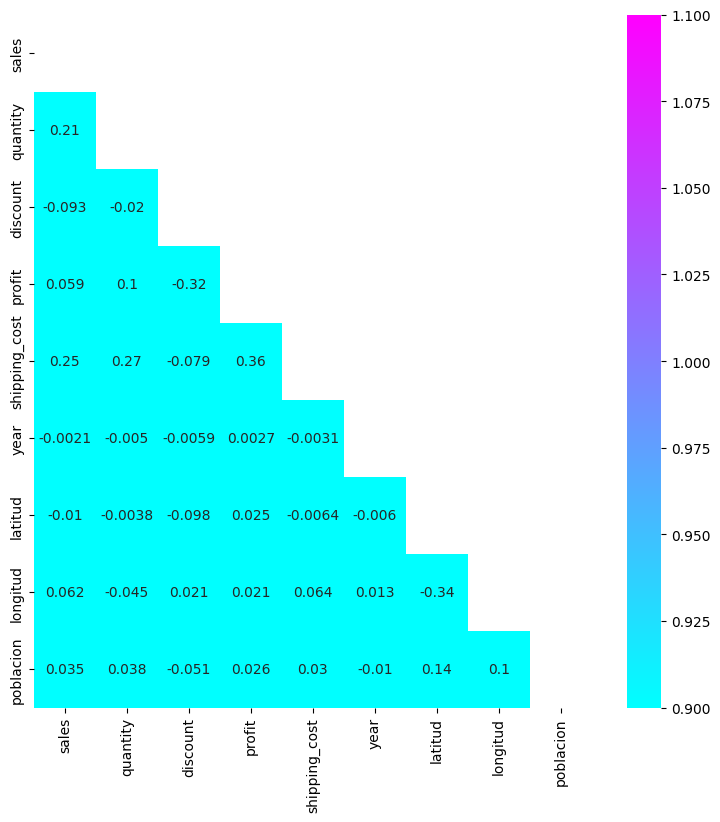

In [8]:
matriz_correlacion(df)

Relaciones más destacadas:

- `sales` y `quantity` (r = 0.21), correlación positiva débil, lo que indica que, en general, cuando aumenta la cantidad vendida, también tienden a aumentar las ventas, aunque la relación no es fuerte.

- `sales` y `shipping_cost` (r = 0.25), correlación débil-moderada positiva; tiene sentido, ya que los pedidos más grandes o costosos suelen implicar gastos de envío mayores.

- `shipping_cost` y `profit` (r = 0.36), es la correlación más alta del gráfico, aunque sigue siendo moderada; podría indicar que los envíos más caros se asocian con márgenes de beneficio algo mayores (quizá por pedidos de mayor valor).

- `discount` y `profit` (r = -0.32), correlación negativa moderada, lo que sugiere que aplicar descuentos más altos suele reducir los beneficios.

Relaciones débiles o inexistentes:

- Entre `year`, `latitud`, `longitud` y las demás variables, las correlaciones son muy próximas a cero, lo que indica ausencia de relación lineal.

- `poblacion` apenas muestra relación con las demás variables (valores entre 0.02 y 0.10), por lo que la demografía de la ciudad no parece influir directamente en las ventas o beneficios.

Conclusiones:

- No existen correlaciones fuertes entre las variables del dataset.

- Las únicas relaciones algo más relevantes son:

    - A mayor cantidad, mayores ventas.

    - A mayor coste de envío, mayor venta y beneficio.

    - A mayor descuento, menor beneficio.

### Relaciones cruzadas de `sales` como variable objetivo con las variables numéricas

In [9]:
df.columns

Index(['order_id', 'order_date', 'ship_date', 'ship_mode', 'customer_name',
       'segment', 'state', 'country', 'market', 'region', 'product_id',
       'category', 'sub_category', 'product_name', 'sales', 'quantity',
       'discount', 'profit', 'shipping_cost', 'order_priority', 'year',
       'admin_name', 'latitud', 'longitud', 'poblacion'],
      dtype='object')

In [10]:
col_num = 'sales'

cols_num = df.select_dtypes(include='number').columns

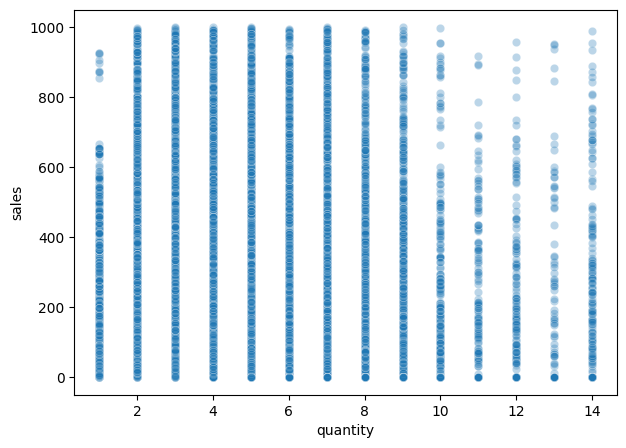

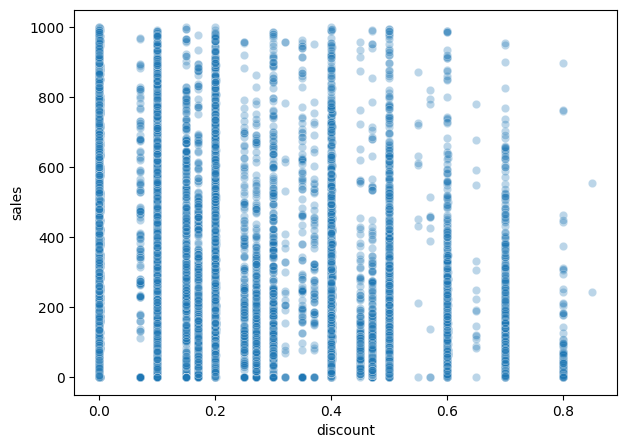

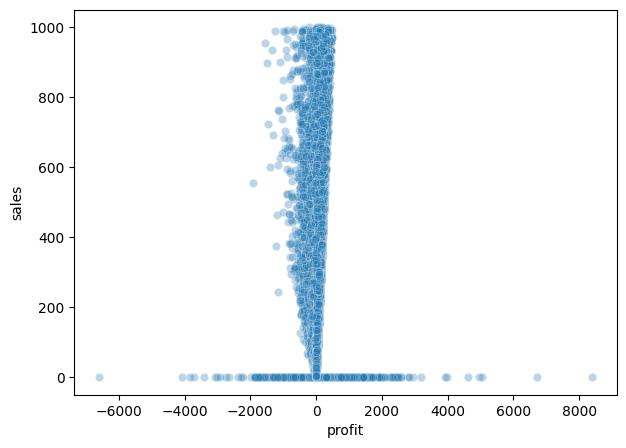

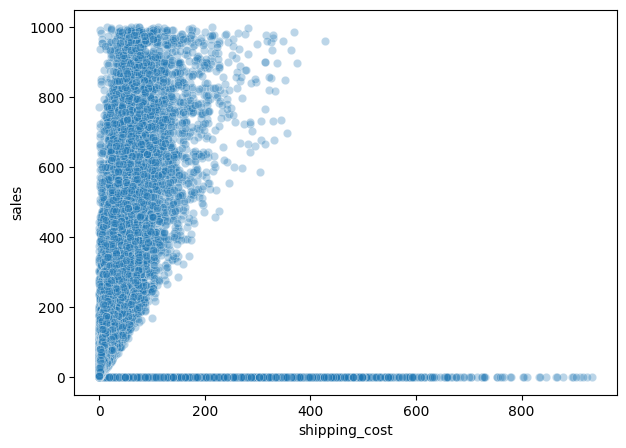

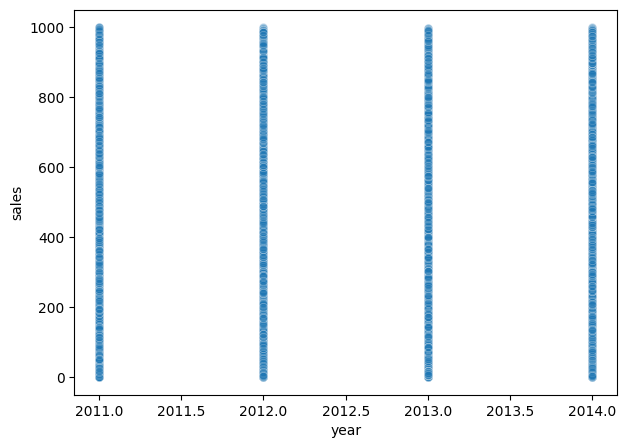

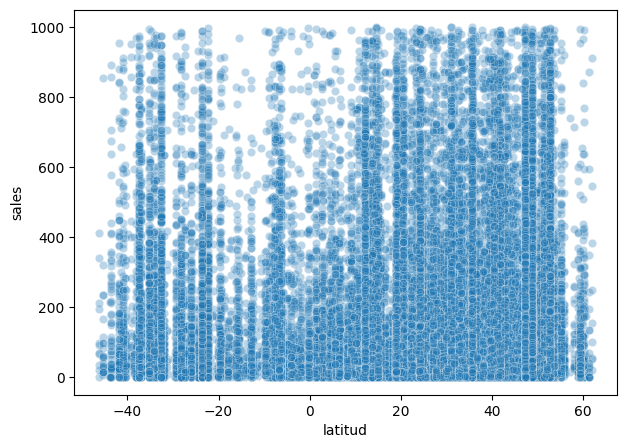

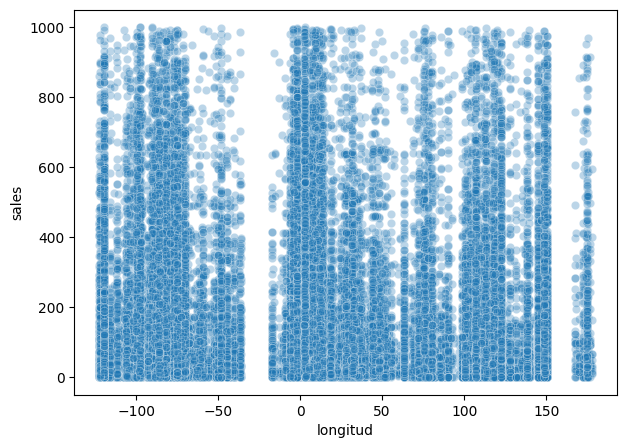

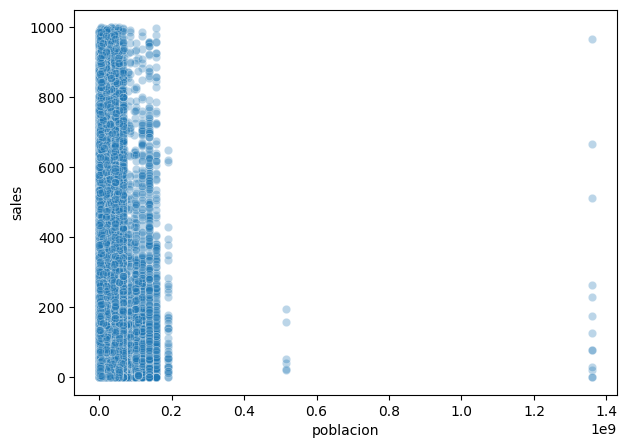

In [11]:
for col in cols_num:

    if col == col_num:
        continue
        
    plt.figure(figsize=(7,5))
    sns.scatterplot(data=df, x=col, y=col_num, alpha=0.3)
    plt.show()

- Relación entre `quantity` y `sales`.
El gráfico muestra una relación positiva, donde las ventas tienden a aumentar ligeramente conforme se incrementa la cantidad de productos vendidos, aunque la dispersión indica que no existe una relación lineal fuerte.

- Relación entre `discount` y `sales`.
Se observa una dispersión amplia y sin una tendencia clara, lo que sugiere que el descuento no influye directamente en el nivel de ventas, al menos de forma lineal.

- Relación entre `profit` y `sales`.
El gráfico muestra que la mayoría de las ventas se concentran alrededor de beneficios cercanos a cero, con algunos valores extremos de pérdidas y ganancias. No se aprecia una relación lineal clara entre ventas y beneficio.

- Relación entre `shipping_cost` y `sales`.
Existe una relación positiva moderada, ya que los pedidos con costes de envío más altos suelen corresponder a ventas de mayor valor, aunque también hay mucha variabilidad en los datos.

- Relación entre `year` y `sales`.
Las ventas se distribuyen de forma uniforme por año, lo que indica que no hay un cambio significativo en los niveles de ventas entre los años analizados.

- Relación entre `latitud` y `sales`.
El gráfico no muestra una tendencia clara, pero sí se aprecia que la mayoría de las ventas se concentran en latitudes correspondientes al hemisferio norte, donde existen más puntos de venta y mayor actividad comercial.

- Relación entre `longitud` y `sales`.
Las ventas se concentran en zonas geográficas específicas, principalmente en torno a América, Europa y Asia, lo que refleja la distribución geográfica de los países con mayor actividad comercial.

- Relación entre `poblacion` y `sales`.
Se observa una alta concentración de ventas en ciudades con baja población, mientras que las urbes más grandes presentan menos puntos de venta, lo que sugiere que las ventas no dependen directamente del tamaño poblacional.

### Análisis de relaciones cruzadas de `sales` con las columnas categóricas y numéricas

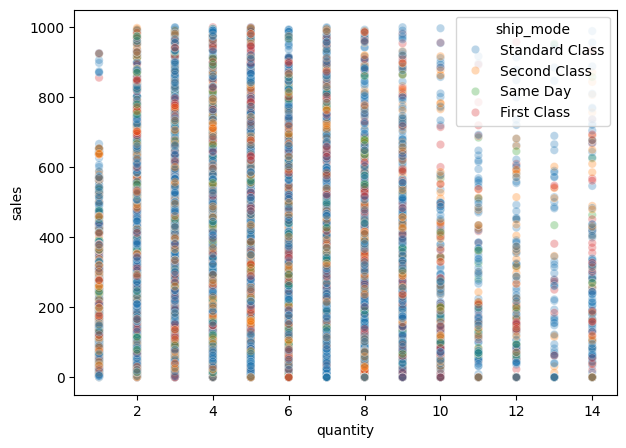

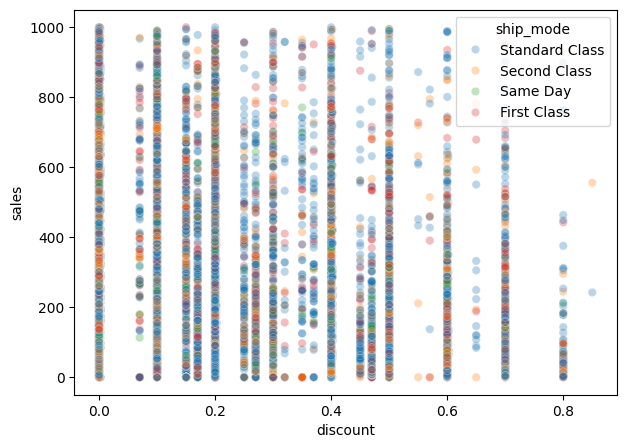

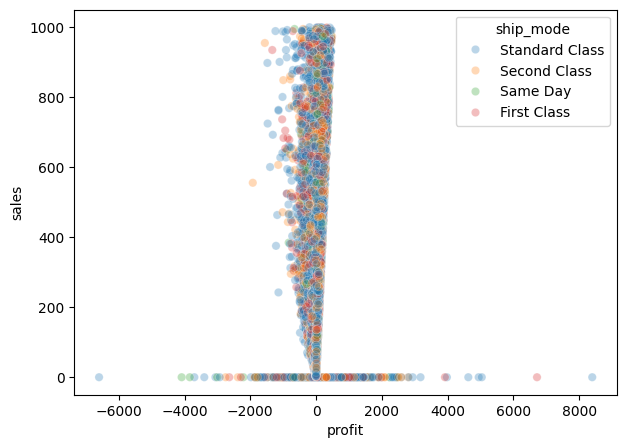

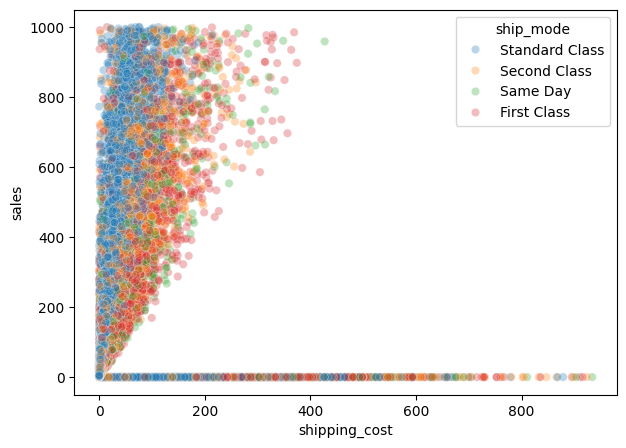

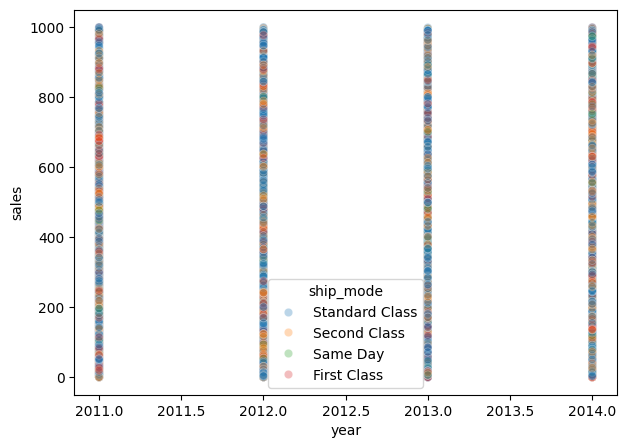

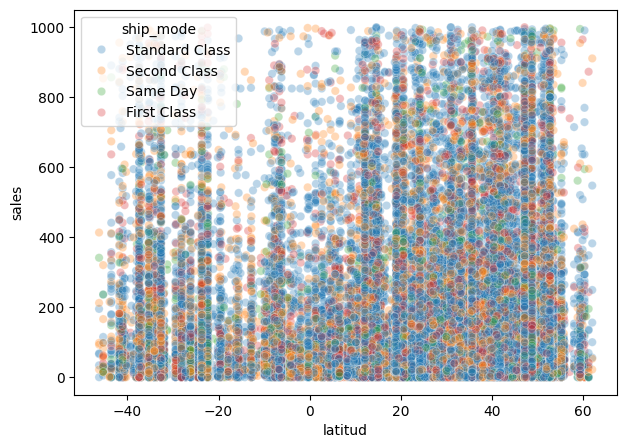

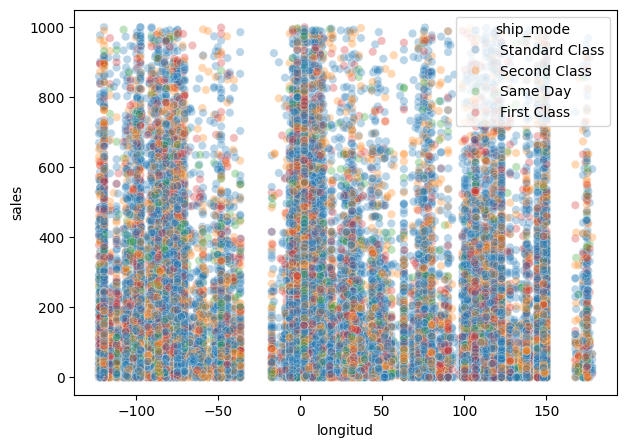

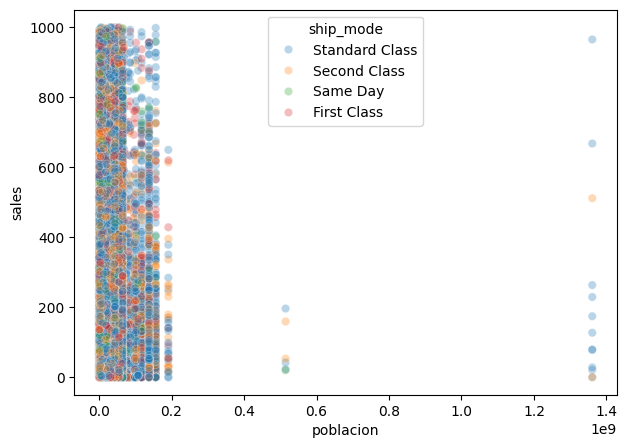

In [12]:
col_num = 'sales'
col_cat = 'ship_mode'
cols_num = df.select_dtypes(include='number').columns

for col in cols_num:
    
    if col == col_num:
        continue

    plt.figure(figsize=(7,5))
    sns.scatterplot(data=df, x=col, y=col_num, hue=col_cat, alpha=0.3)
    plt.show()

- `sales` vs `quantity` (por `ship_mode`)
Las ventas no muestran diferencias claras entre los modos de envío; la mayoría de los pedidos con pocas unidades presentan ventas similares independientemente del tipo de envío.


- `sales` vs `discount` (por `ship_mode`)
No se aprecia una relación evidente entre el descuento aplicado y las ventas; los distintos modos de envío se distribuyen de forma uniforme a lo largo de los valores de descuento.


- `sales` vs `profit` (por `ship_mode`)
Las ventas se concentran en torno a márgenes de beneficio próximos a cero, sin que el modo de envío marque diferencias notables en el nivel de rentabilidad.


- `sales` vs `shipping_cost` (por `ship_mode`)
A medida que aumentan los costes de envío, las ventas tienden a ser algo mayores, aunque la diferencia entre modos de envío no es muy significativa.


- `sales` vs `year` (por `ship_mode`)
No hay una tendencia temporal marcada; los modos de envío se distribuyen de manera uniforme a lo largo de los años del análisis.


- `sales` vs `latitud` (por `ship_mode`)
Las ventas están repartidas a lo largo de las diferentes latitudes, sin que el modo de envío presente una concentración geográfica concreta.


- `sales` vs `longitud` (por `ship_mode`)
Las ventas se encuentran distribuidas en todas las longitudes, con una presencia homogénea de los modos de envío en las distintas regiones.


- `sales` vs `poblacion` (por `ship_mode`)
La mayoría de las ventas provienen de zonas con poblaciones bajas o medias; los modos de envío mantienen proporciones similares independientemente del tamaño de la población.



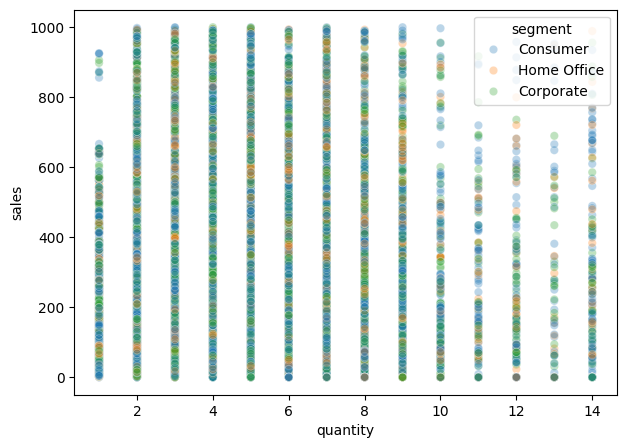

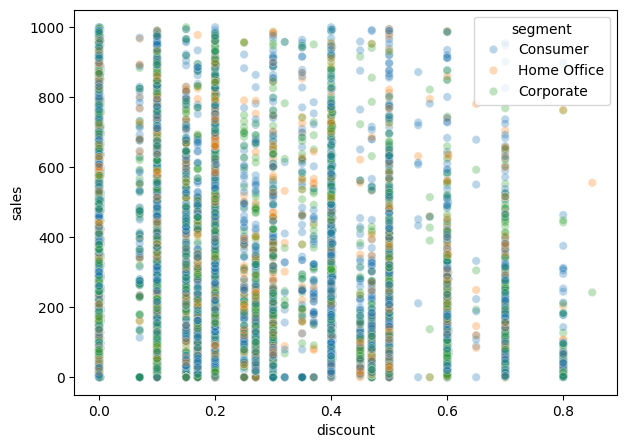

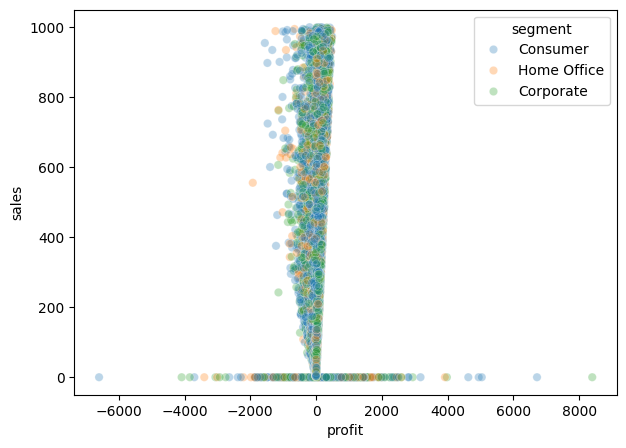

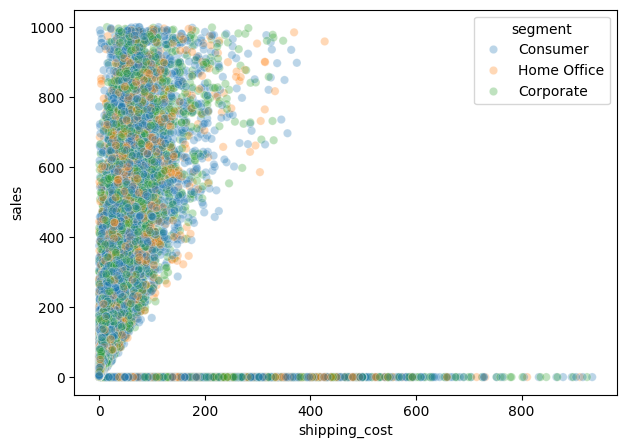

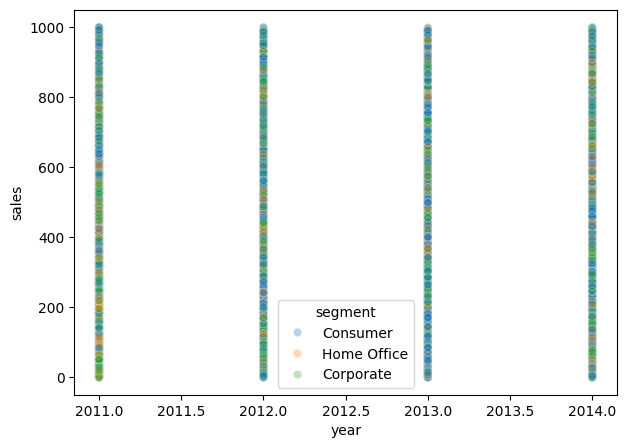

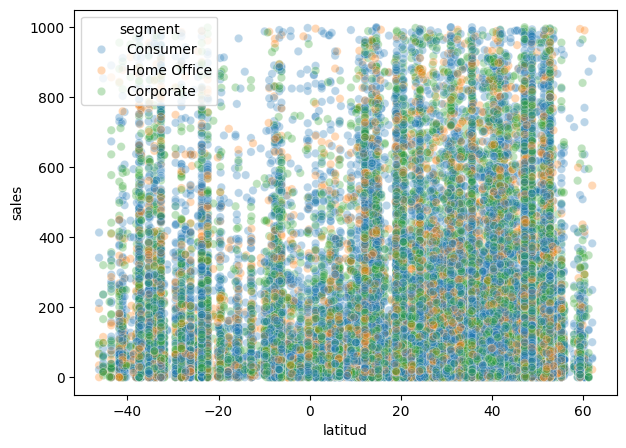

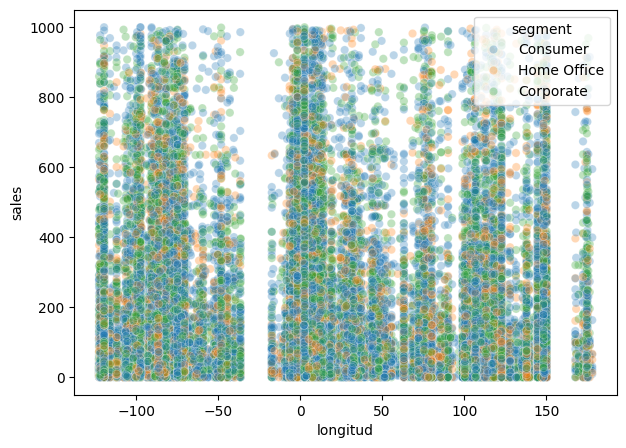

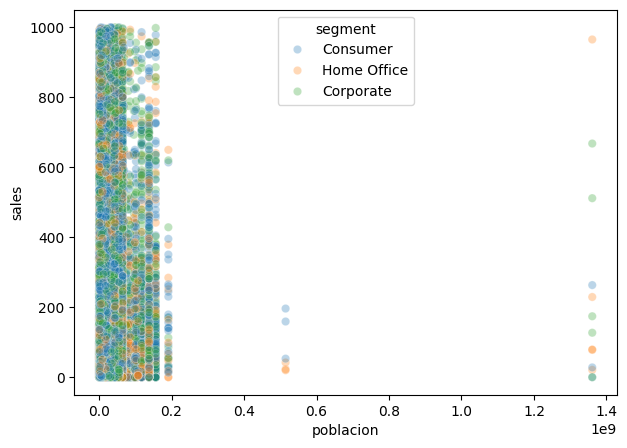

In [13]:
col_num = 'sales'
col_cat = 'segment'
cols_num = df.select_dtypes(include='number').columns

for col in cols_num:
    
    if col == col_num:
        continue

    plt.figure(figsize=(7,5))
    sns.scatterplot(data=df, x=col, y=col_num, hue=col_cat, alpha=0.3)
    plt.show()

- `sales` vs `quantity` (por `segment`): Las ventas aumentan ligeramente con la cantidad vendida, siendo el segmento Consumer el que presenta más operaciones en todos los niveles de cantidad.

- `sales` vs `discount` (por `segment`): No se observa una relación clara entre el descuento y las ventas, aunque el segmento Consumer concentra la mayoría de las transacciones en todos los niveles de descuento.

- `sales` vs `profit` (por `segment`): Los tres segmentos muestran una alta concentración de ventas con beneficios bajos o negativos, siendo Consumer nuevamente el más frecuente.

- `sales` vs `shipping_cost` (por `segment`): Existe una leve relación positiva entre el coste de envío y las ventas, con predominio del segmento Consumer en los valores más altos.

- `sales` vs `year` (por `segment`): Las ventas se distribuyen de manera uniforme a lo largo de los años, sin grandes diferencias entre segmentos.

- `sales` vs `latitud` (por `segment`): Las ventas están repartidas en todas las latitudes, con mayor presencia de Consumer en regiones más pobladas.

- `sales` vs `longitud` (por `segment`): Los tres segmentos mantienen una distribución similar de ventas a lo largo de las diferentes longitudes, con ligera concentración en zonas económicas activas.

- `sales` vs `poblacion` (por `segment`): Las ventas se concentran en ciudades con menor población, destacando el segmento Consumer como el más representativo en casi todos los casos.

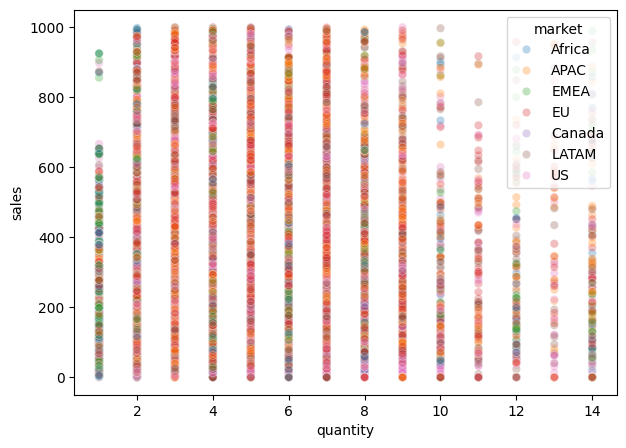

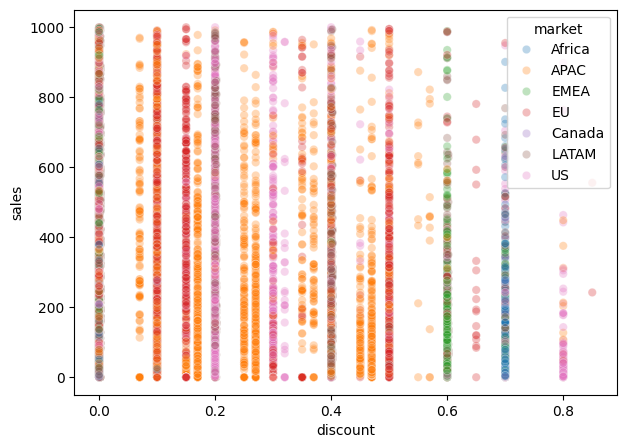

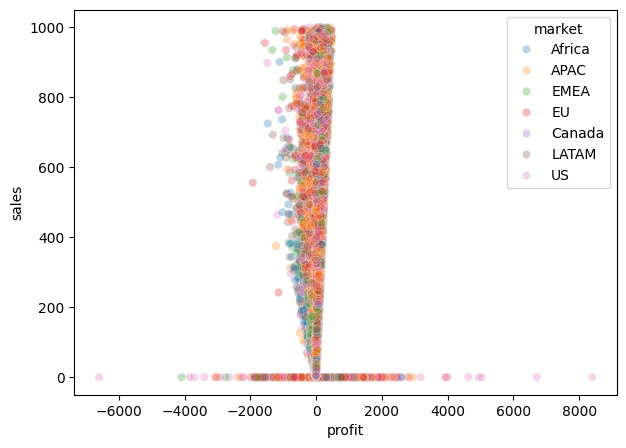

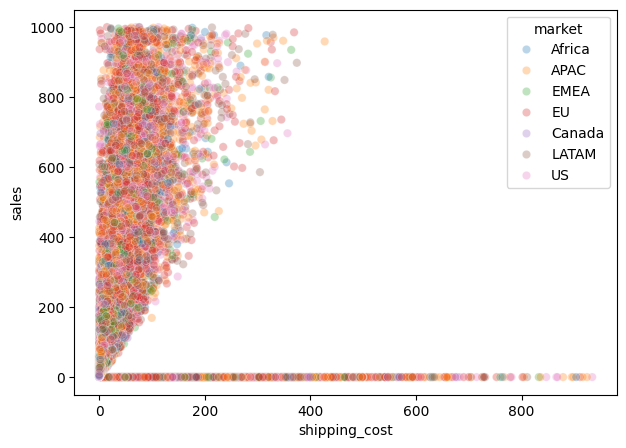

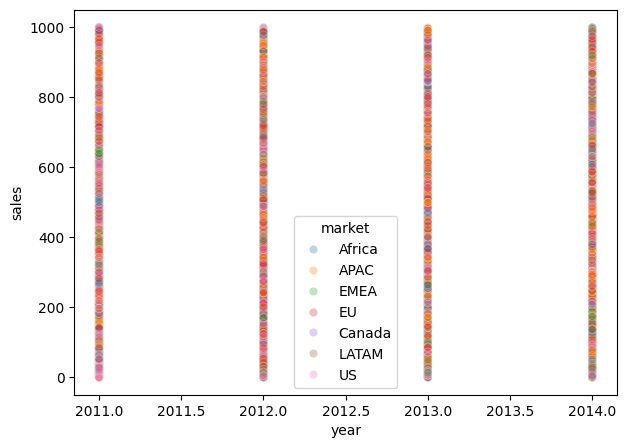

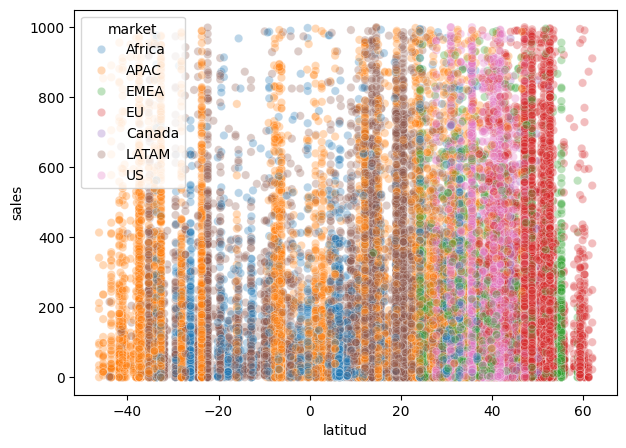

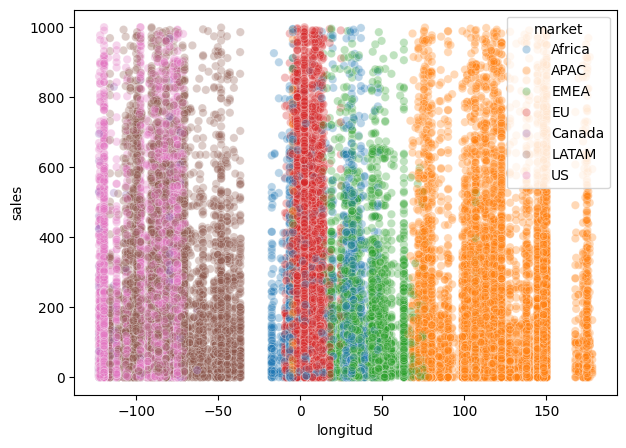

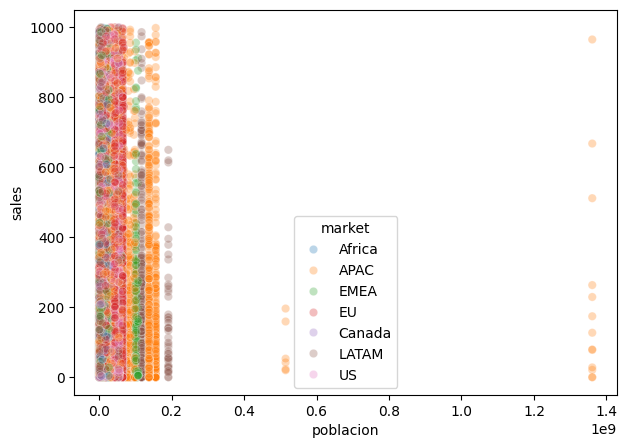

In [14]:
col_num = 'sales'
col_cat = 'market'
cols_num = df.select_dtypes(include='number').columns

for col in cols_num:
    
    if col == col_num:
        continue

    plt.figure(figsize=(7,5))
    sns.scatterplot(data=df, x=col, y=col_num, hue=col_cat, alpha=0.3)
    plt.show()

- `sales` vs `quantity` (por `market`): Las ventas aumentan ligeramente con la cantidad vendida, siendo los mercados de APAC y US los que presentan más operaciones en todos los niveles de cantidad.

- `sales` vs `discount` (por `market`): No se aprecia una relación clara entre el descuento y las ventas, aunque APAC y LATAM muestran una mayor presencia de transacciones con diferentes niveles de descuento.

- `sales` vs `profit` (por `market`): Todos los mercados presentan una alta concentración de ventas con beneficios bajos o negativos, destacando EU y US como los de mayor volumen en esa zona.

- `sales` vs `shipping_cost` (por `market`): Existe una ligera relación positiva entre el coste de envío y las ventas, con EU y APAC acumulando las ventas con mayores costes de envío.

- `sales` vs `year` (por `market`): Las ventas se mantienen relativamente estables entre 2011 y 2014, con EU y US mostrando una presencia constante a lo largo de los años.

- `sales` vs `latitud` (por `market`): Se observan concentraciones diferenciadas de ventas por latitud según el mercado, donde APAC, US y EU presentan las mayores densidades en sus respectivas zonas geográficas.

- `sales` vs `longitud` (por `market`): La distribución de ventas refleja la localización geográfica de cada mercado, con agrupaciones notorias de LATAM en el hemisferio occidental y APAC en el oriental.

- `sales` vs `poblacion` (por `market`): Las ventas tienden a concentrarse en mercados con poblaciones menores o medias, mientras que APAC destaca en países con grandes poblaciones, como reflejo de su tamaño demográfico.

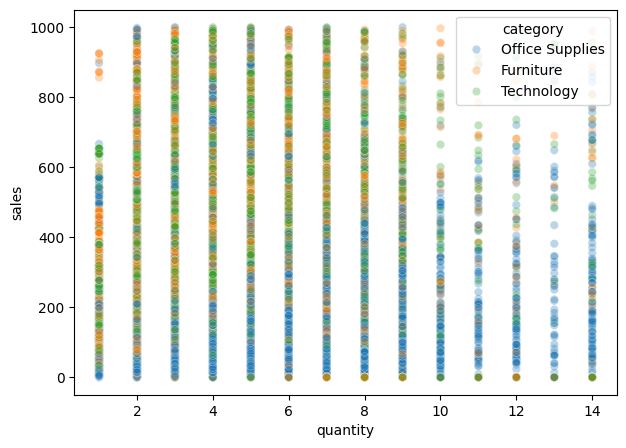

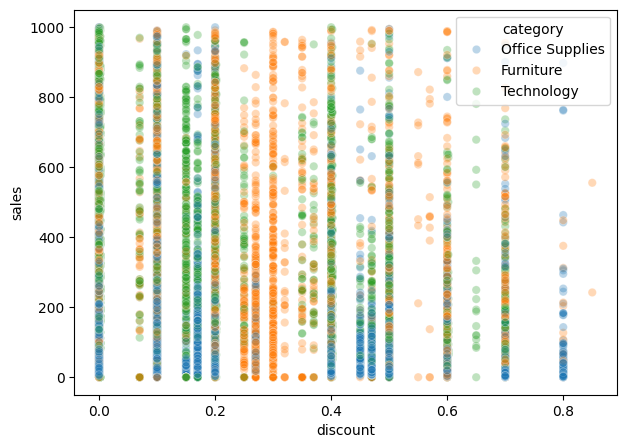

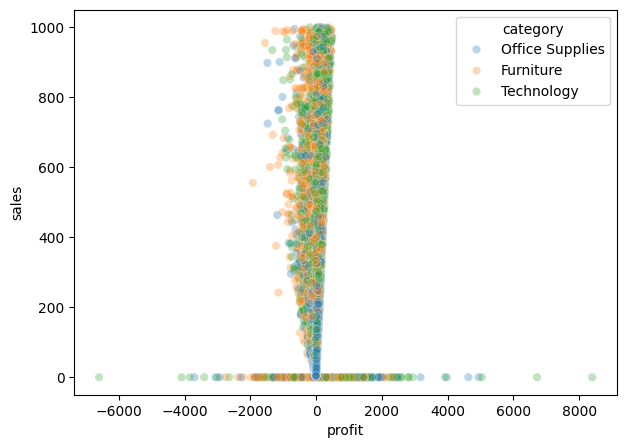

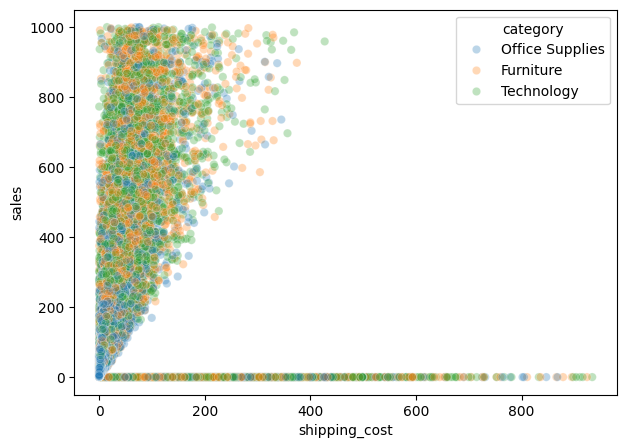

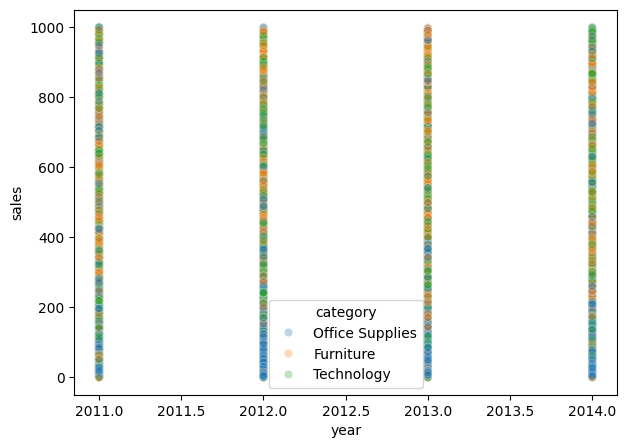

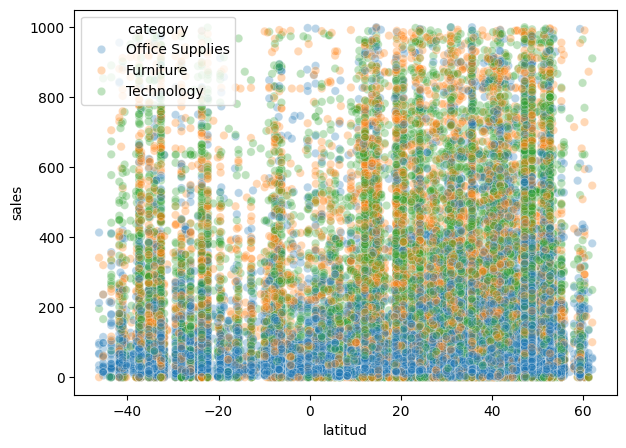

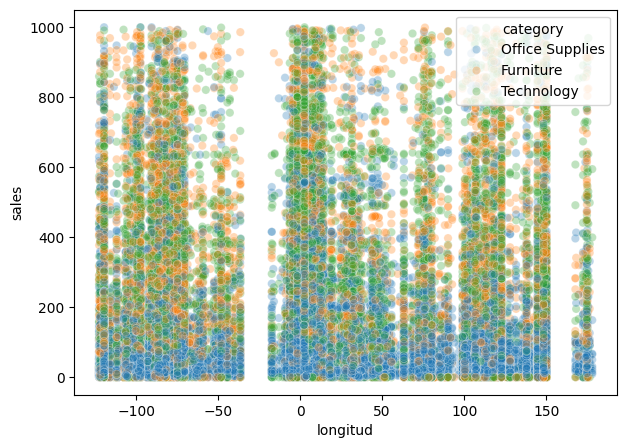

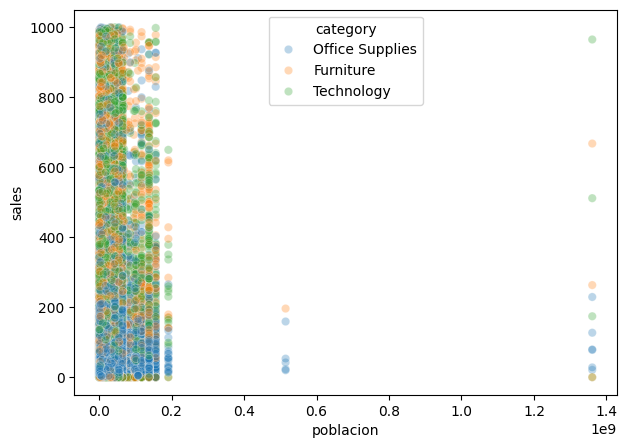

In [15]:
col_num = 'sales'
col_cat = 'category'
cols_num = df.select_dtypes(include='number').columns

for col in cols_num:
    
    if col == col_num:
        continue

    plt.figure(figsize=(7,5))
    sns.scatterplot(data=df, x=col, y=col_num, hue=col_cat, alpha=0.3)
    plt.show()

- `sales` vs `quantity` (por `category`): Las ventas aumentan ligeramente con la cantidad, destacando la categoría Office Supplies por su frecuencia en todos los niveles de cantidad.

- `sales` vs `discount` (por `category`): No hay una relación clara entre descuento y ventas, aunque Furniture muestra mayor variabilidad en las transacciones con descuentos altos.

- `sales` vs `profit` (por `category`): Todas las categorías concentran sus ventas en niveles de beneficio bajos o negativos, especialmente Furniture y Technology.

- `sales` vs `shipping_cost` (por `category`): Se observa una leve relación positiva entre el coste de envío y las ventas, predominando Office Supplies en la mayoría de los valores.

- `sales` vs `year` (por `category`): Las ventas se mantienen estables a lo largo de los años sin diferencias significativas entre categorías.

- `sales` vs `latitud` (por `category`): Las ventas están distribuidas por todas las latitudes, con una presencia notable de Technology en regiones más altas.

- `sales` vs `longitud` (por `category`): Las tres categorías tienen una distribución similar de ventas a lo largo de las longitudes, con una ligera mayor actividad en zonas económicas clave.

- `sales` vs `poblacion` (por `category`): Las ventas se concentran en zonas con menor población, siendo Office Supplies la categoría más representativa.


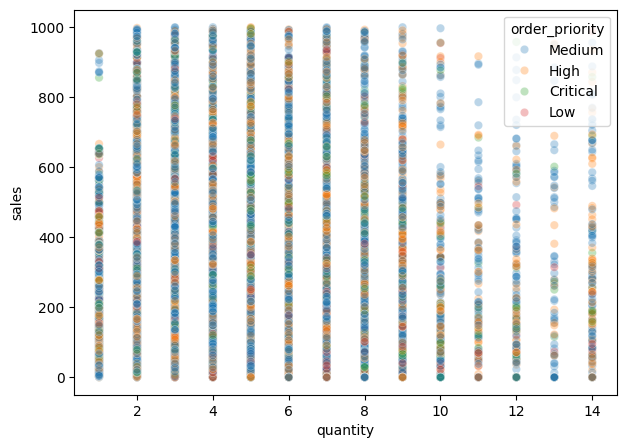

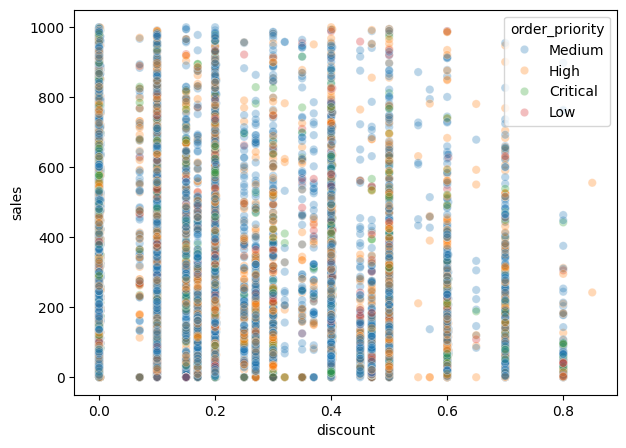

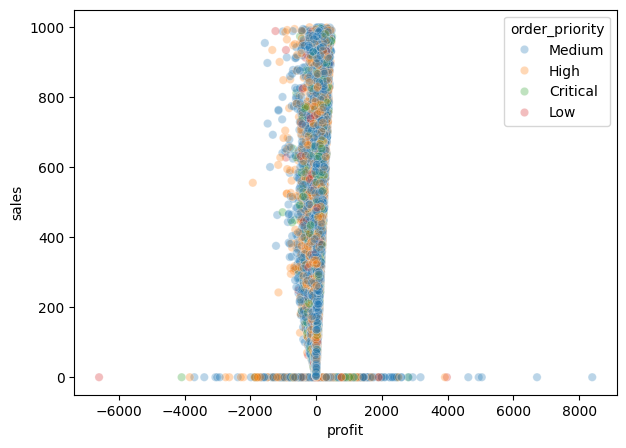

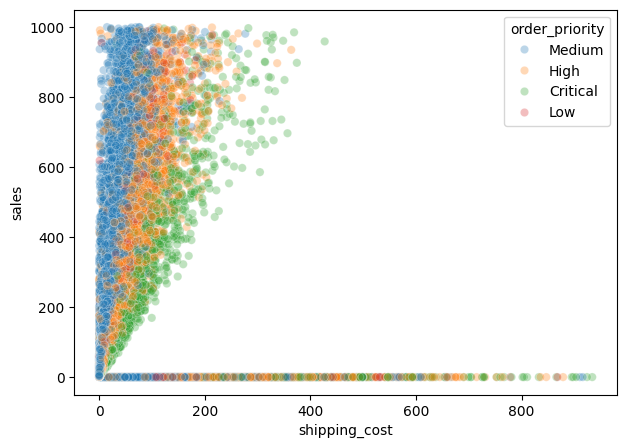

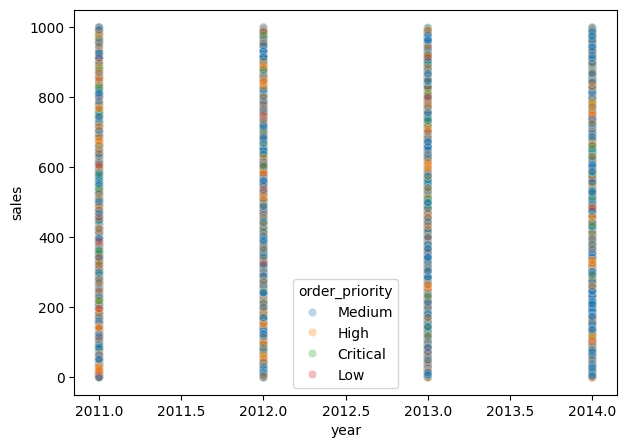

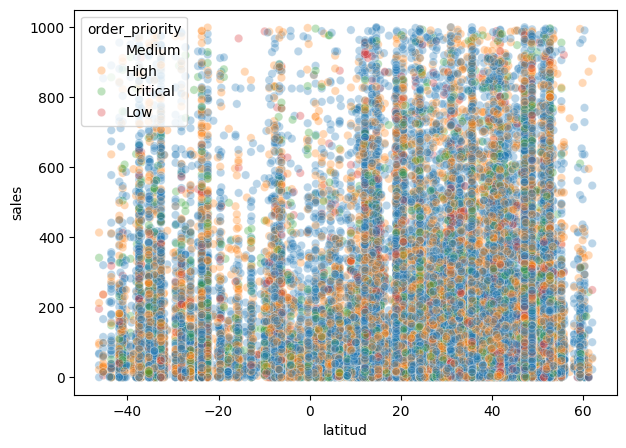

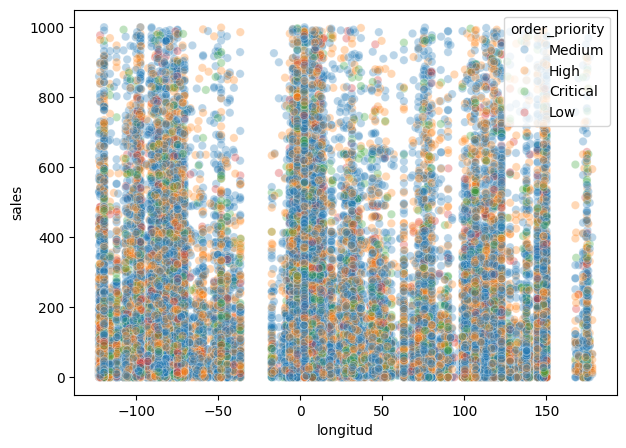

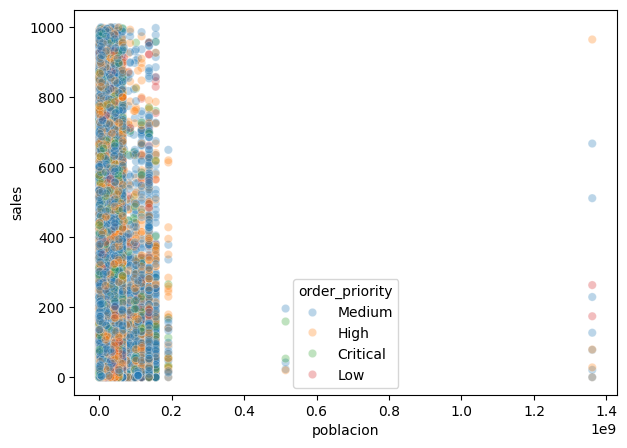

In [16]:
col_num = 'sales'
col_cat = 'order_priority'
cols_num = df.select_dtypes(include='number').columns

for col in cols_num:
    
    if col == col_num:
        continue

    plt.figure(figsize=(7,5))
    sns.scatterplot(data=df, x=col, y=col_num, hue=col_cat, alpha=0.3)
    plt.show()

- `sales` vs `quantity` (por `order_priority`): Las ventas aumentan ligeramente con la cantidad vendida, predominando los pedidos con prioridad Medium en todos los niveles de cantidad.

- `sales` vs `discount` (por `order_priority`): No se aprecia una relación clara entre descuento y ventas, aunque los pedidos de prioridad Medium y High concentran la mayoría de las transacciones.

- `sales` vs `profit` (por `order_priority`): La mayoría de las ventas presentan beneficios bajos o negativos, con predominio de la prioridad Medium en casi todos los rangos de beneficio.

- `sales` vs `shipping_cost` (por `order_priority`): Existe una leve relación positiva entre el coste de envío y las ventas, destacando las prioridades Medium y High en los niveles de coste más altos.

- `sales` vs `year` (por `order_priority`): Las ventas se mantienen estables a lo largo de los años, sin diferencias significativas entre los distintos niveles de prioridad.

- `sales` vs `latitud` (por `order_priority`): Las ventas están distribuidas de forma uniforme en todas las latitudes, con ligera concentración de pedidos Medium y High en regiones más pobladas.

- `sales` vs `longitud` (por `order_priority`): Los diferentes niveles de prioridad muestran una distribución similar de ventas a lo largo de las longitudes, sin destacar un patrón regional claro.

- `sales` vs `poblacion` (por `order_priority`): Las ventas se concentran en zonas con menor población, siendo los pedidos de prioridad Medium los más frecuentes en la mayoría de los casos.

No he hecho el análisis de las relaciones cruzadas de `sales` con las columnas categóricas `order_id`, `state`, `country`, `region`, `sub_category` y `admin_name` debido a que tienen numerosas variables y no se pueden analizar de manera correcta.

Ahora queremos mostrar las categorías de cada variable ordenadas de menor a mayor media de ventas.

In [17]:
col_num = 'sales'

cols_cat = df.select_dtypes(include=['object', 'category']).columns

In [18]:
cols_cat

Index(['order_id', 'order_date', 'ship_date', 'ship_mode', 'customer_name',
       'segment', 'state', 'country', 'market', 'region', 'product_id',
       'category', 'sub_category', 'product_name', 'order_priority',
       'admin_name'],
      dtype='object')

In [21]:
col_num = 'sales'

cols_cat = df.select_dtypes(include=['object', 'category']).columns

for col in cols_cat:

    if col == 'ship_mode':
        continue

    cats_ordenadas = df.groupby(col)[col_num].mean().sort_values().index

    print(cats_ordenadas)

Index(['UP-2012-8420', 'IN-2013-15368', 'IN-2013-47197', 'IN-2013-46798',
       'CA-2013-117121', 'UZ-2013-6040', 'MX-2012-164791', 'IN-2013-10965',
       'IN-2013-11938', 'CA-2013-132304',
       ...
       'IN-2014-51628', 'TU-2012-8730', 'MX-2013-148005', 'IN-2013-25042',
       'ID-2012-79789', 'ID-2013-30537', 'IN-2012-34310', 'MX-2014-165260',
       'ES-2011-5251246', 'CA-2011-121629'],
      dtype='object', name='order_id', length=25035)
Index(['2011-06-02', '2012-08-07', '2011-12-06', '2012-08-01', '2013-06-10',
       '2011-05-02', '2014-12-01', '2011-07-08', '2012-05-05', '2012-06-01',
       ...
       '2011-11-12', '2013-05-05', '2012-04-11', '2012-01-07', '2011-02-01',
       '2012-09-09', '2012-11-03', '2013-10-11', '2013-08-09', '2013-03-02'],
      dtype='object', name='order_date', length=565)
Index(['2012-08-04', '2011-06-07', '2011-05-01', '2011-09-04', '2012-03-02',
       '2011-08-02', '2012-12-01', '2012-06-05', '2011-07-10', '2014-06-02',
       ...
       '20

En estos diagramas de caja, podemos observar la correlación entre la variable `sales` con `ship_mode`, `segment`, `market`, `region`, `category` y `order_priority`.

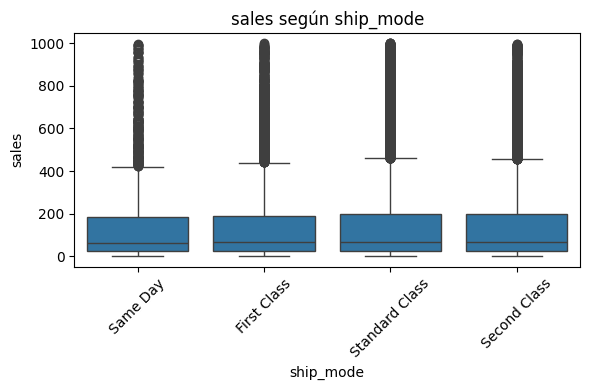

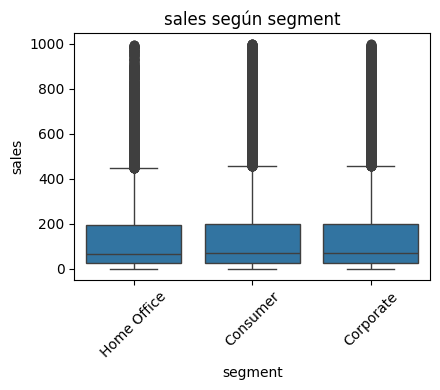

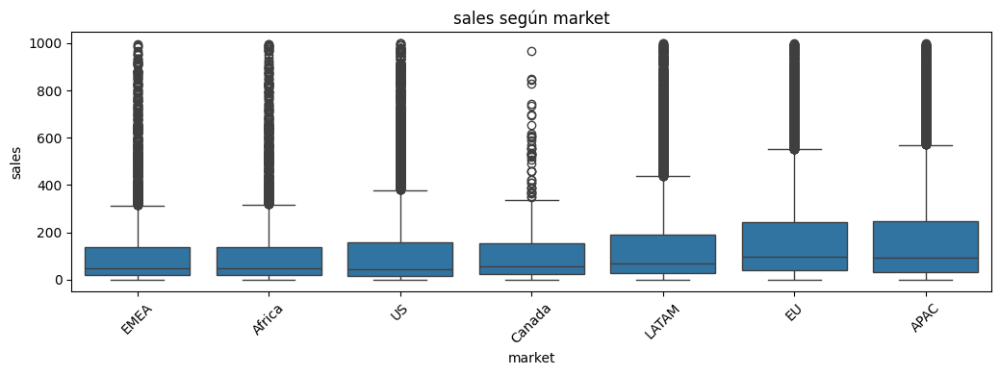

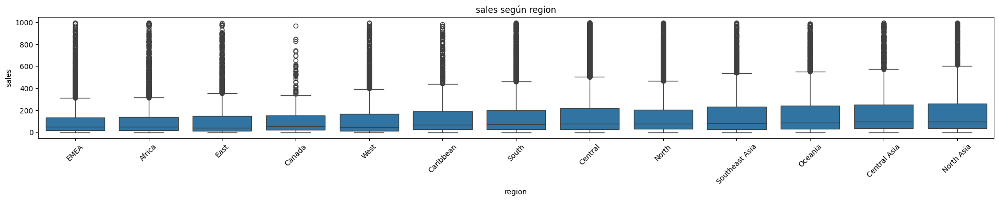

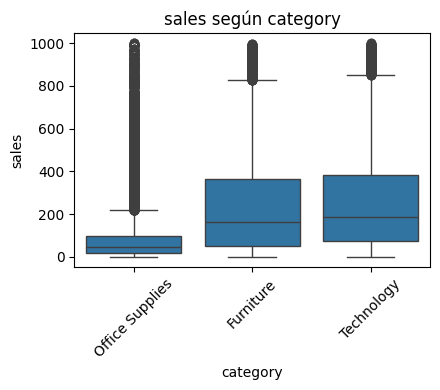

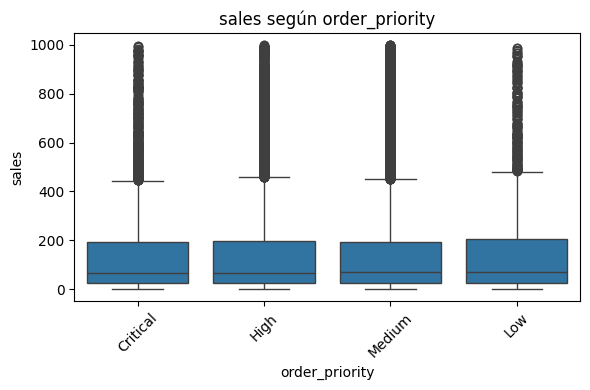

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns

col_num = 'sales'

# Solo columnas categóricas con pocas categorías
cols_cat = [
    col for col in df.select_dtypes(include=['object']).columns
    if df[col].nunique() <= 15 and col != 'order_id'
]

for col in cols_cat:
    # Calcular orden de categorías
    cats_ordenadas = df.groupby(col)[col_num].mean().sort_values().index

    # Calcular dimensiones del gráfico dinámicamente
    num_cats = len(cats_ordenadas)
    fig_width = max(4, num_cats * 1.5)
    fig_height = 4

    plt.figure(figsize=(fig_width, fig_height))
    sns.boxplot(x=col, y=col_num, data=df, order=cats_ordenadas)
    plt.title(f"{col_num} según {col}")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

### Cálculo de las proporciones de cada categoría dentro de cada valor de 'col'

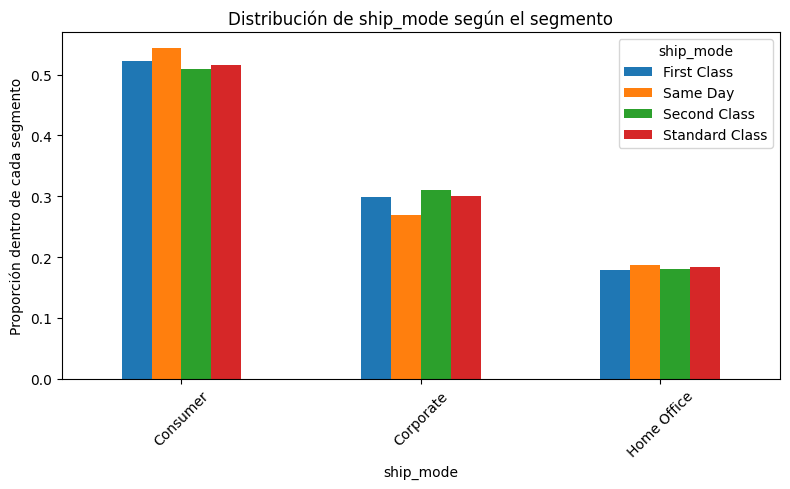

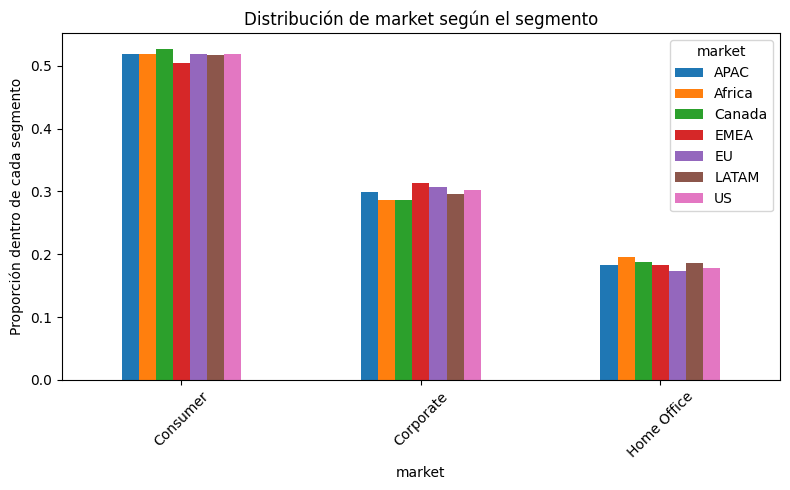

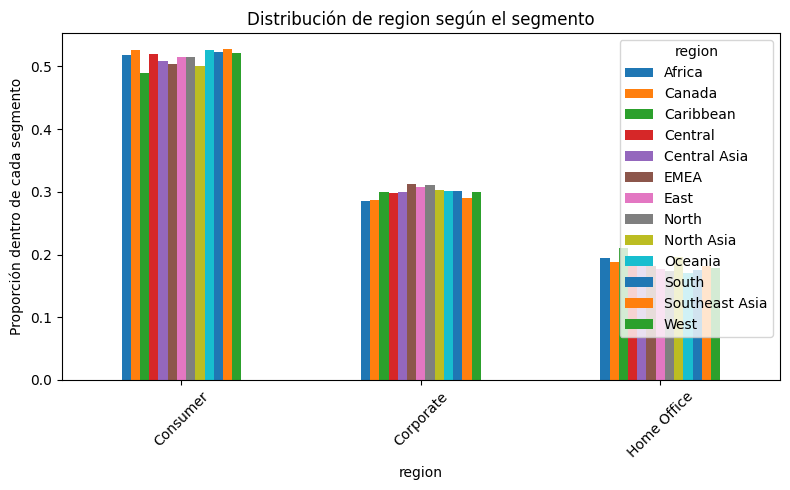

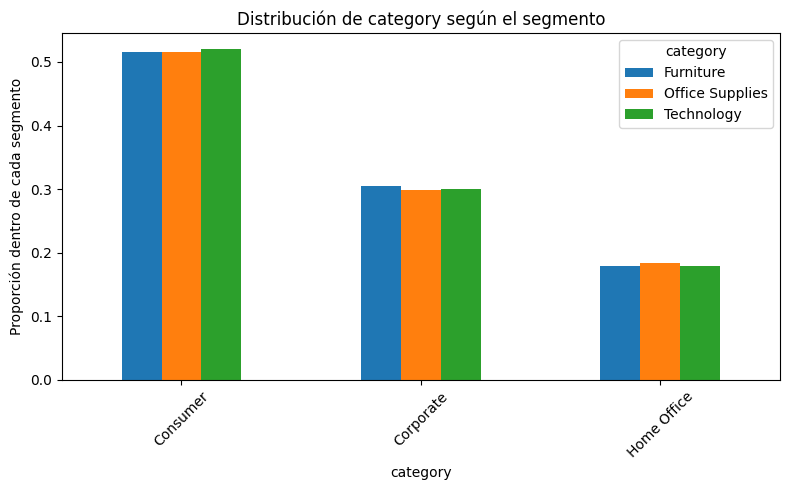

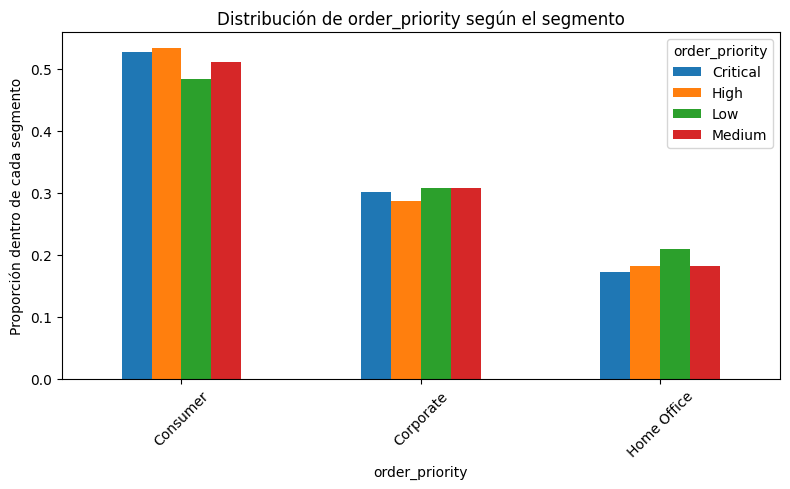

In [29]:
# Seleccionamos variables categóricas con pocas categorías (máximo 15)
cat_cols = [
    col for col in df.select_dtypes(include='object').columns
    if col != 'segment' and df[col].nunique() <= 15
]
# Bucle sobre cada variable categórica
for col in cat_cols:
     # Calculamos proporciones de cada categoría de 'segment' dentro de cada valor de 'col'
    prop = df.groupby(col)['segment'].value_counts(normalize=True).unstack().fillna(0)

    # Ordenamos las columnas para mantener coherencia
    prop = prop[prop.columns.sort_values()]

    # Gráfico de barras lado a lado
    prop.T.plot(kind='bar', stacked=False, figsize=(8, 5))

    plt.title(f"Distribución de {col} según el segmento")
    plt.ylabel("Proporción dentro de cada segmento")
    plt.xlabel(col)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

- `ship_mode` según `segment`: Los tres segmentos mantienen proporciones similares en los modos de envío, destacando que la mayoría de los pedidos se realizan en "First Class" y "Same Day", especialmente en el segmento Consumer.

- `market` según `segment`: La distribución del mercado es equilibrada entre los segmentos, con una ligera predominancia del segmento Consumer en todos los mercados analizados.

- `region` según `segment`: Las proporciones por región se mantienen estables entre los segmentos, con Consumer liderando en la mayoría de las regiones y Home Office mostrando la menor representación.

- `category` según `segment`: La categoría muestra una distribución uniforme dentro de cada segmento, aunque el segmento Consumer concentra más de la mitad de las ventas en todas las categorías.

- `order_priority` según `segment`: La prioridad de los pedidos se reparte de forma equilibrada entre los niveles, pero el segmento Consumer presenta una ligera predominancia en las órdenes de mayor prioridad ("High" y "Critical").

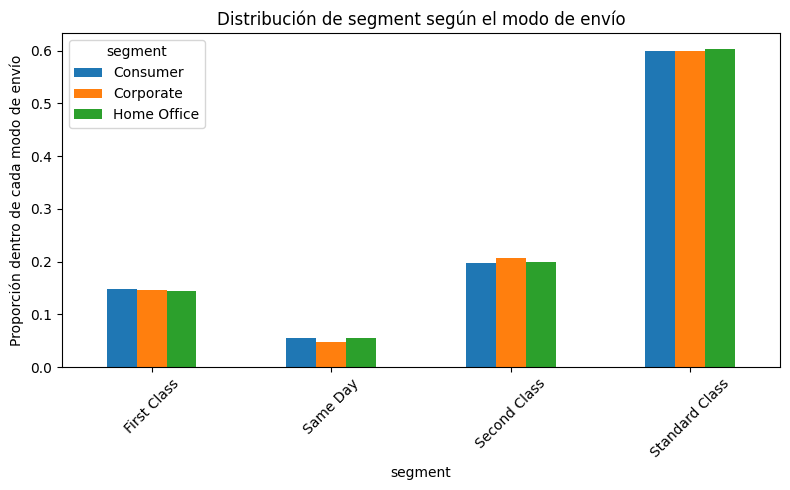

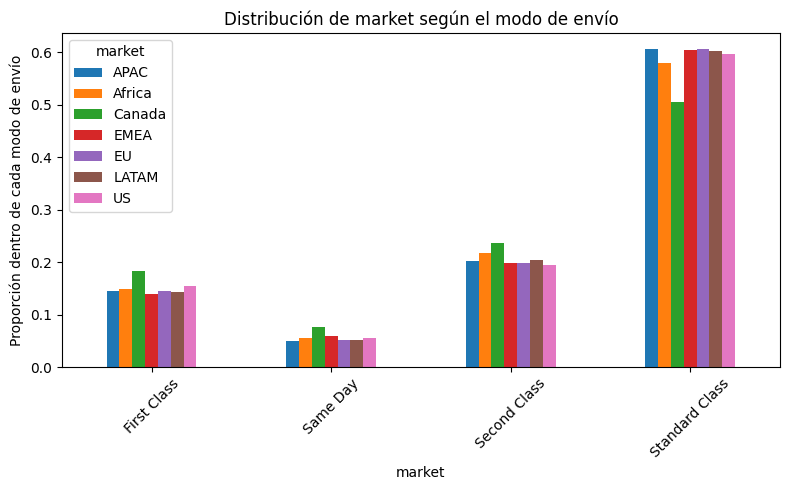

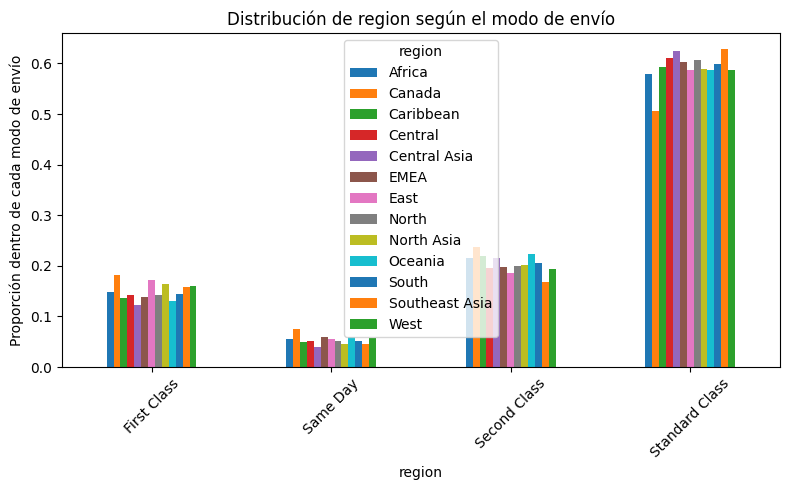

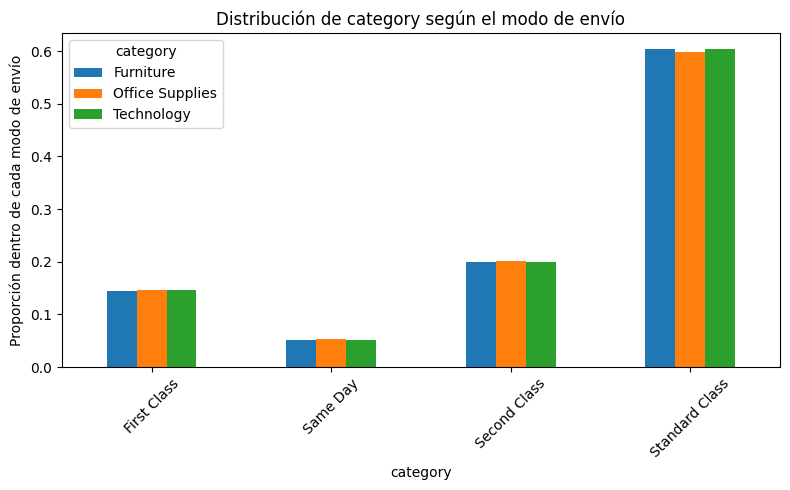

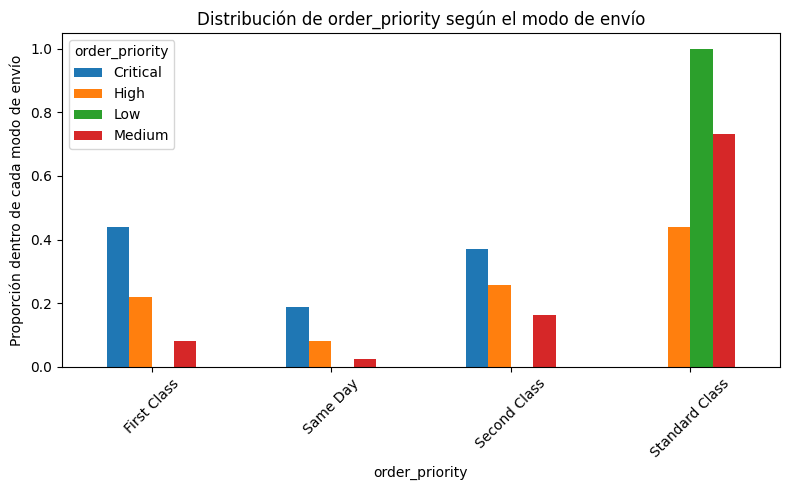

In [31]:
# Seleccionamos variables categóricas con pocas categorías (máximo 15)
cat_cols = [
    col for col in df.select_dtypes(include='object').columns
    if col != 'ship_mode' and df[col].nunique() <= 15
]
# Bucle sobre cada variable categórica
for col in cat_cols:
     # Calculamos proporciones de cada categoría de 'ship_mode' dentro de cada valor de 'col'
    prop = df.groupby(col)['ship_mode'].value_counts(normalize=True).unstack().fillna(0)

    # Ordenamos las columnas para mantener coherencia
    prop = prop[prop.columns.sort_values()]

    # Gráfico de barras lado a lado
    prop.T.plot(kind='bar', stacked=False, figsize=(8, 5))

    plt.title(f"Distribución de {col} según el modo de envío")
    plt.ylabel("Proporción dentro de cada modo de envío")
    plt.xlabel(col)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

- `segment` según `ship_mode`: Los tres segmentos utilizan mayoritariamente el modo de envío Standard Class, sin diferencias significativas entre ellos.

- `market` según `ship_mode`: En todos los mercados predomina el uso de Standard Class, aunque Canada presenta una proporción ligeramente menor en comparación con los demás.

- `region` según `ship_mode`: Todas las regiones muestran preferencia por Standard Class, con ligeras variaciones en Second Class y First Class según la localización.

- `category` según `ship_mode`: Las tres categorías presentan una distribución muy similar, predominando ampliamente el envío Standard Class.

- `order_priority` según `ship_mode`: Los pedidos de baja prioridad (Low) se concentran casi exclusivamente en Standard Class, mientras que los de prioridad crítica (Critical) se reparten más entre First Class y Second Class.

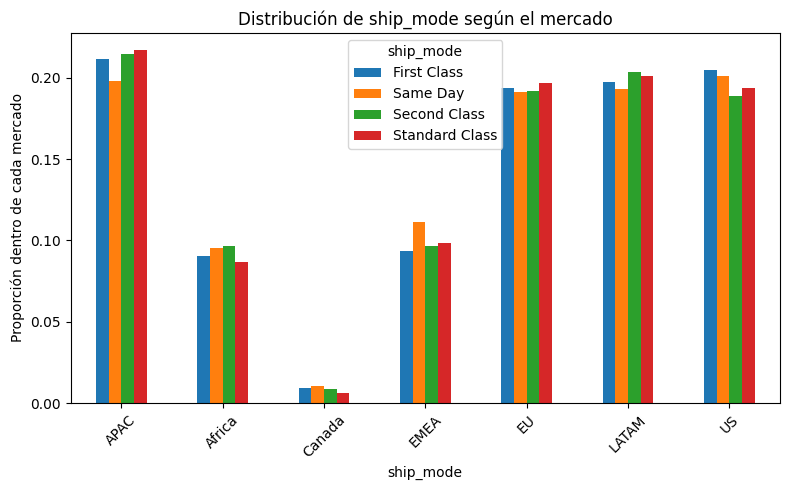

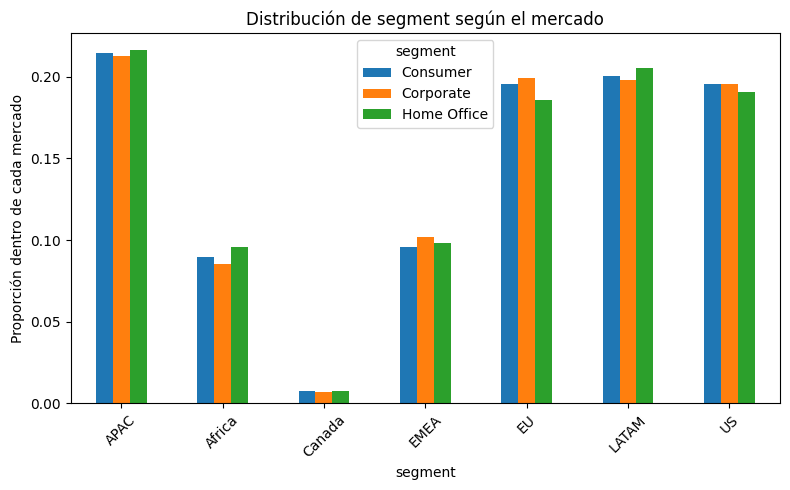

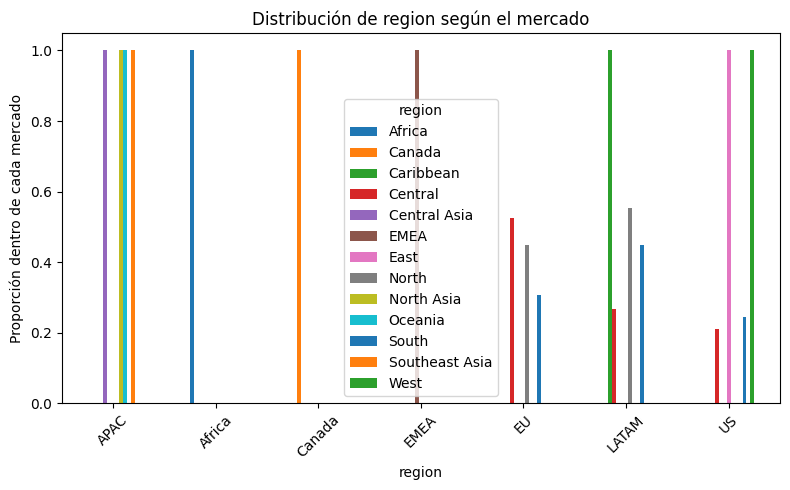

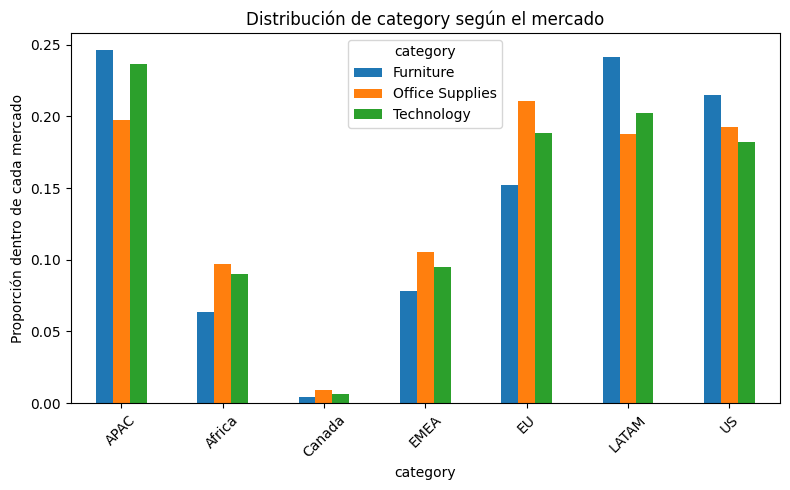

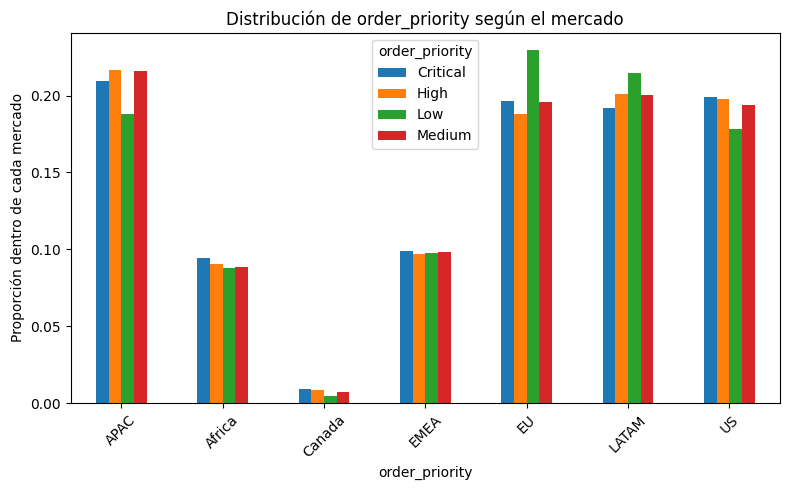

In [32]:
# Seleccionamos variables categóricas con pocas categorías (máximo 15)
cat_cols = [
    col for col in df.select_dtypes(include='object').columns
    if col != 'market' and df[col].nunique() <= 15
]
# Bucle sobre cada variable categórica
for col in cat_cols:
     # Calculamos proporciones de cada categoría de 'market' dentro de cada valor de 'col'
    prop = df.groupby(col)['market'].value_counts(normalize=True).unstack().fillna(0)

    # Ordenamos las columnas para mantener coherencia
    prop = prop[prop.columns.sort_values()]

    # Gráfico de barras lado a lado
    prop.T.plot(kind='bar', stacked=False, figsize=(8, 5))

    plt.title(f"Distribución de {col} según el mercado")
    plt.ylabel("Proporción dentro de cada mercado")
    plt.xlabel(col)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

- `ship_mode` según `market`: El modo de envío se distribuye de forma homogénea entre los mercados, con APAC, EU, LATAM y US destacando por mayores proporciones de envíos en todas las clases.

- `segment` según `market`: Los tres segmentos presentan una distribución equilibrada en todos los mercados, con APAC, EU, LATAM y US concentrando la mayor proporción de transacciones.

- `region` según `market`: Cada mercado se asocia claramente a sus regiones específicas, mostrando una relación directa entre ubicación geográfica y mercado comercial.

- `category` según `market`: Las tres categorías mantienen proporciones similares dentro de cada mercado, aunque Furniture domina en APAC y LATAM, mientras Office Supplies destaca en Europa (EU).

- `order_priority` según `market`: La prioridad de pedido se reparte de forma equitativa en la mayoría de los mercados, destacando EU y LATAM con una ligera preferencia por prioridades bajas.

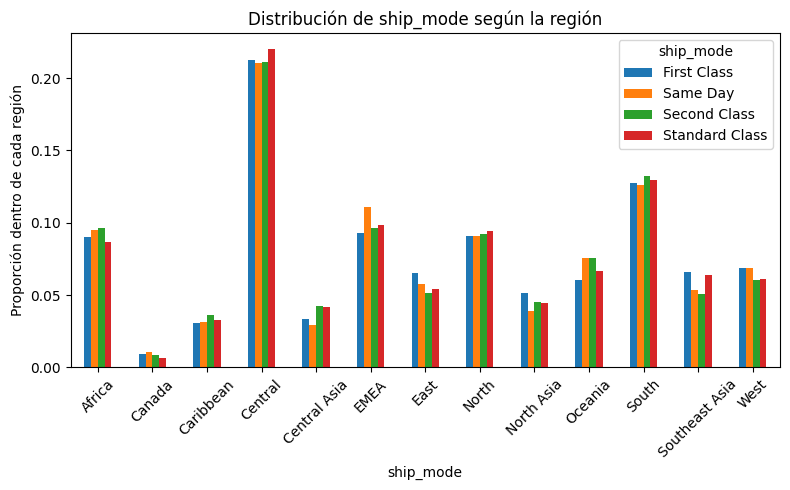

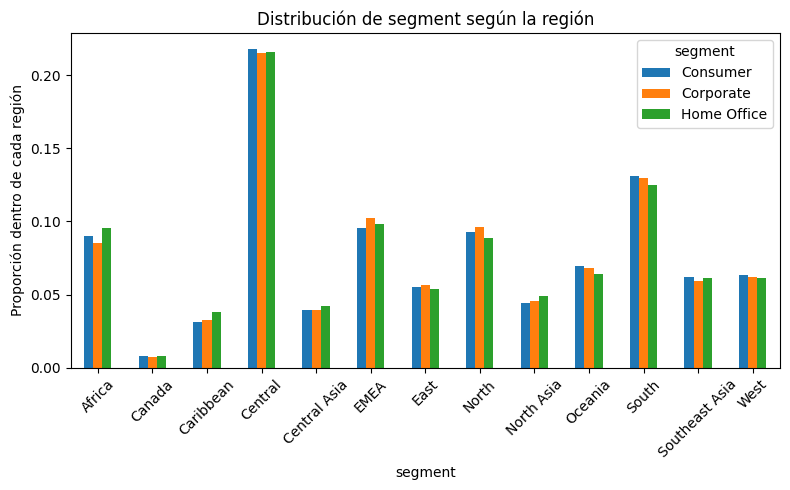

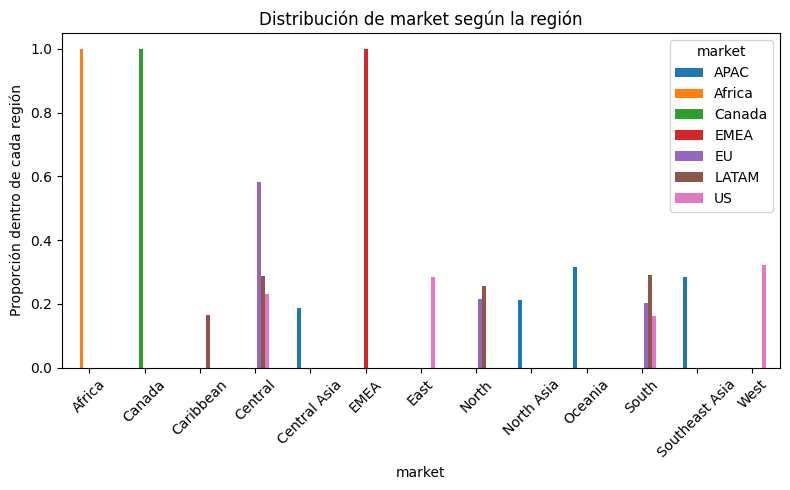

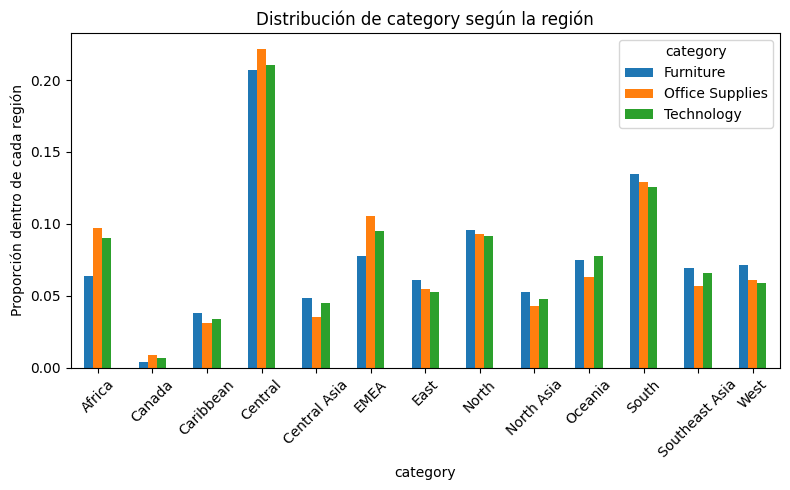

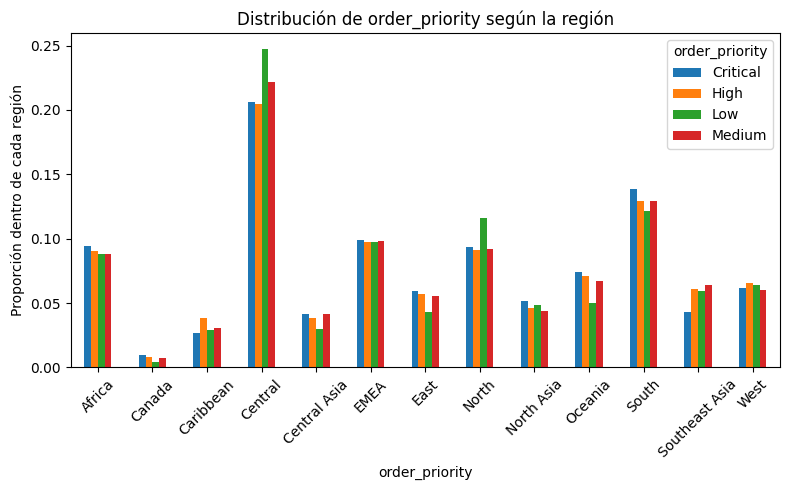

In [33]:
# Seleccionamos variables categóricas con pocas categorías (máximo 15)
cat_cols = [
    col for col in df.select_dtypes(include='object').columns
    if col != 'region' and df[col].nunique() <= 15
]
# Bucle sobre cada variable categórica
for col in cat_cols:
     # Calculamos proporciones de cada categoría de 'region' dentro de cada valor de 'col'
    prop = df.groupby(col)['region'].value_counts(normalize=True).unstack().fillna(0)

    # Ordenamos las columnas para mantener coherencia
    prop = prop[prop.columns.sort_values()]

    # Gráfico de barras lado a lado
    prop.T.plot(kind='bar', stacked=False, figsize=(8, 5))

    plt.title(f"Distribución de {col} según la región")
    plt.ylabel("Proporción dentro de cada región")
    plt.xlabel(col)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

- `ship_mode` según `region`: La distribución por modo de envío es bastante homogénea entre regiones, con ligera preferencia por Standard Class y Second Class y menor uso de Same Day.

- `segment` según `region`: En todas las regiones predomina el segmento Consumer, seguido de Corporate, mientras que Home Office es el menos representado.

- `market` según `region`: Cada región se asocia casi en exclusiva a un único mercado (EMEA a EMEA, West/South/East a US, North Asia/Oceania a APAC...), reflejando una segmentación geográfica clara.

- `category` según `region`: Las tres categorías mantienen proporciones similares por región, con ligera mayor presencia de Office Supplies en varias zonas y variaciones puntuales de Technology y Furniture.

- `order_priority` según `region`: Las prioridades Critical y High son las más frecuentes en la mayoría de las regiones, destacando Central por una mayor proporción de pedidos Low.

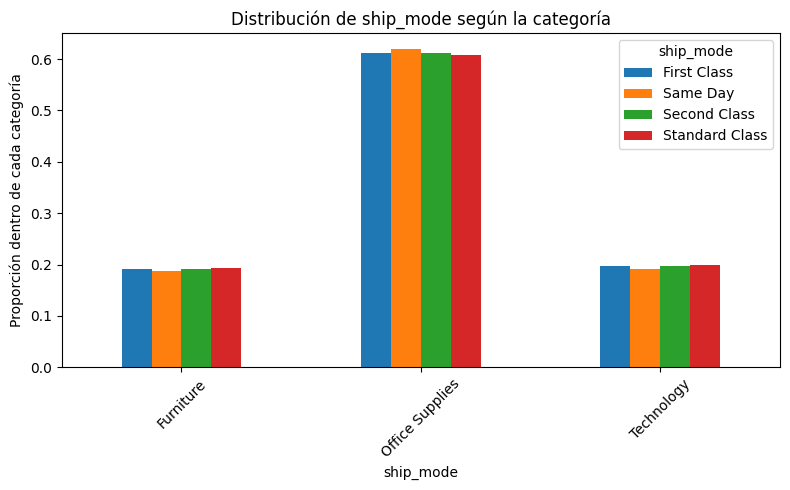

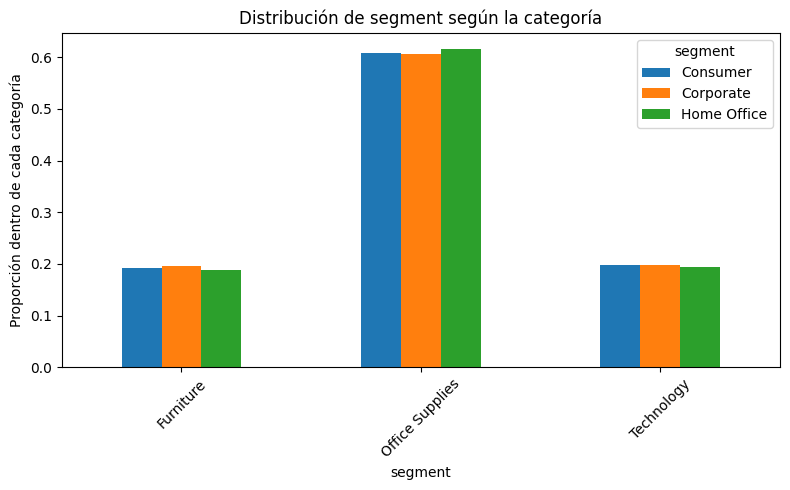

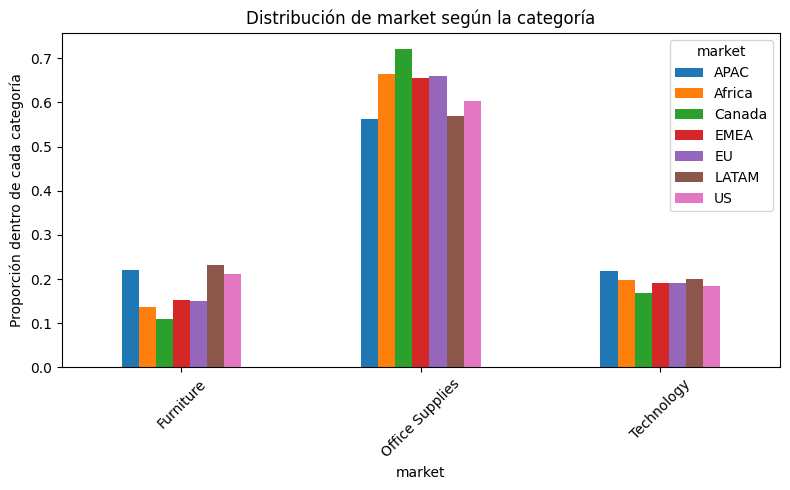

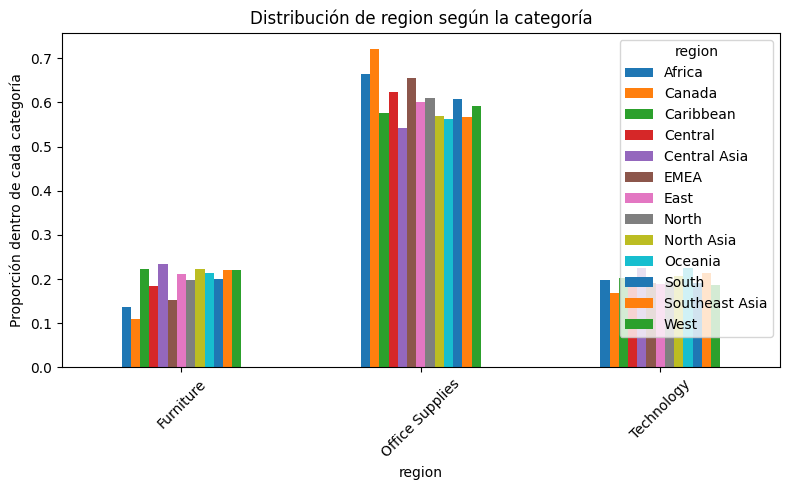

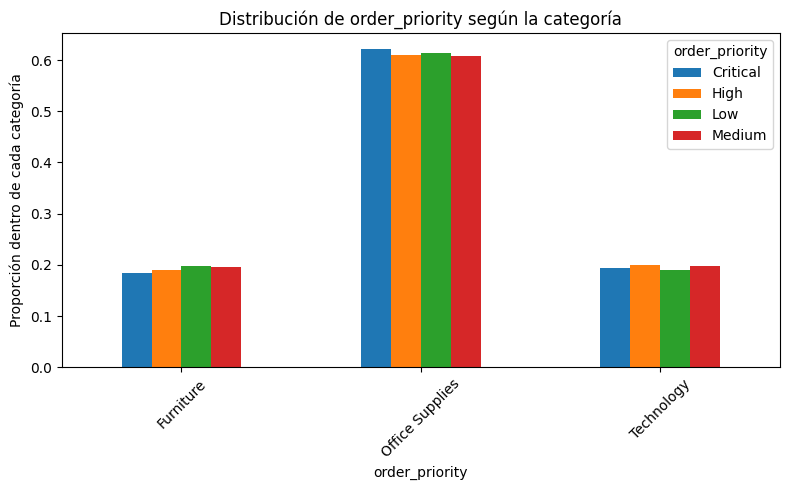

In [34]:
# Seleccionamos variables categóricas con pocas categorías (máximo 15)
cat_cols = [
    col for col in df.select_dtypes(include='object').columns
    if col != 'category' and df[col].nunique() <= 15
]
# Bucle sobre cada variable categórica
for col in cat_cols:
     # Calculamos proporciones de cada categoría de 'category' dentro de cada valor de 'col'
    prop = df.groupby(col)['category'].value_counts(normalize=True).unstack().fillna(0)

    # Ordenamos las columnas para mantener coherencia
    prop = prop[prop.columns.sort_values()]

    # Gráfico de barras lado a lado
    prop.T.plot(kind='bar', stacked=False, figsize=(8, 5))

    plt.title(f"Distribución de {col} según la categoría")
    plt.ylabel("Proporción dentro de cada categoría")
    plt.xlabel(col)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

- `ship_mode` según `category`: La distribución de los modos de envío es uniforme en todas las categorías, predominando Standard Class y Second Class de manera similar.

- `segment` según `category`: La categoría Office Supplies concentra la mayoría de los segmentos, mientras que Furniture y Technology tienen proporciones similares y menores.

- `market` según `category`: Office Supplies domina en todos los mercados, especialmente en Canada, aunque con presencia equilibrada en el resto.

- `region` según `category`: La categoría Office Supplies predomina en la mayoría de las regiones, con mayor presencia en Southeast Asia y Africa. Furniture y Technology mantienen proporciones consistentes.

- `order_priority` según `category`: La distribución de prioridades de pedido es homogénea en todas las categorías, sin diferencias notables entre Critical, High, Low y Medium.


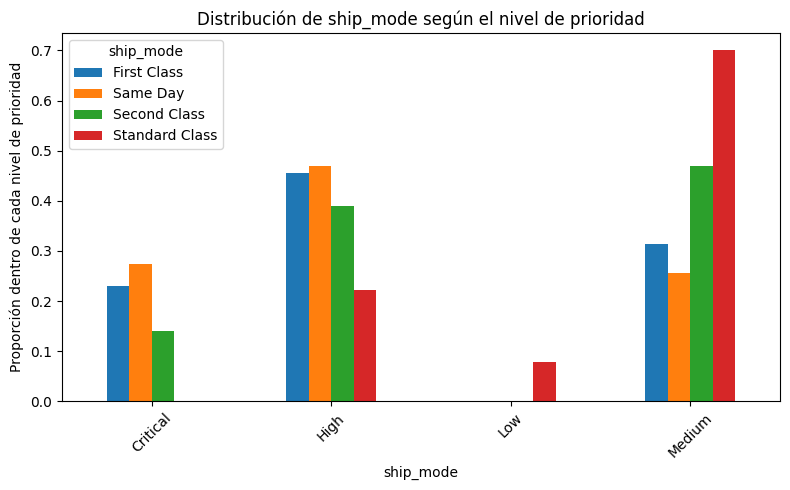

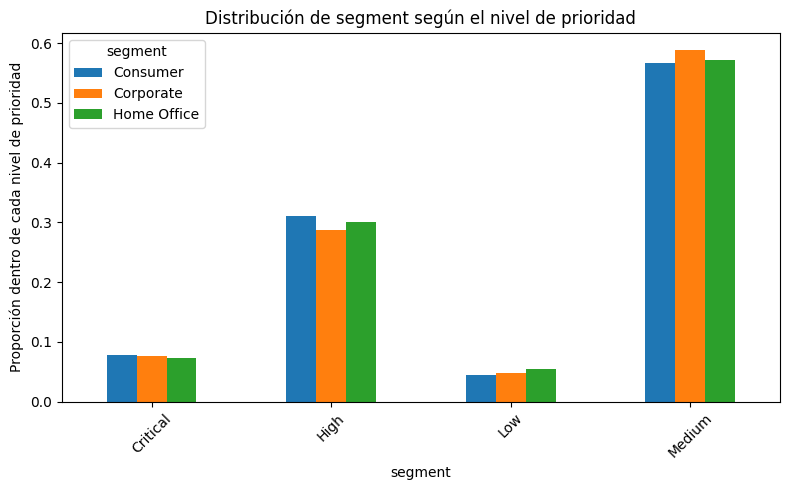

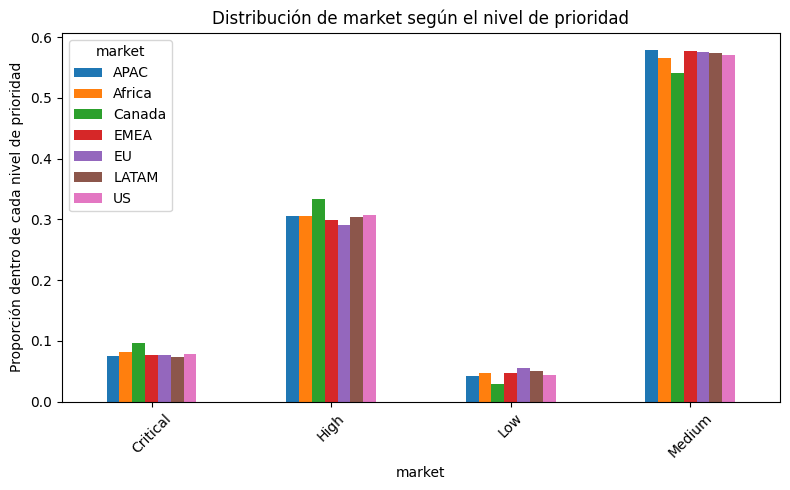

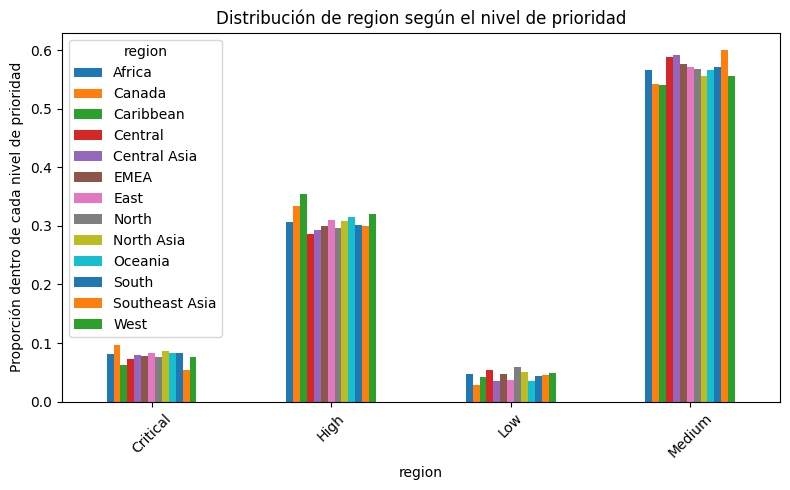

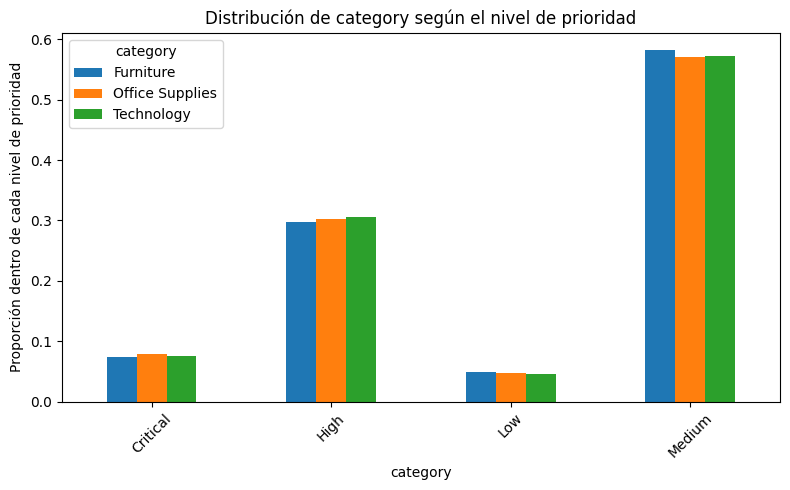

In [35]:
# Seleccionamos variables categóricas con pocas categorías (máximo 15)
cat_cols = [
    col for col in df.select_dtypes(include='object').columns
    if col != 'order_priority' and df[col].nunique() <= 15
]
# Bucle sobre cada variable categórica
for col in cat_cols:
     # Calculamos proporciones de cada categoría de 'order_priority' dentro de cada valor de 'col'
    prop = df.groupby(col)['order_priority'].value_counts(normalize=True).unstack().fillna(0)

    # Ordenamos las columnas para mantener coherencia
    prop = prop[prop.columns.sort_values()]

    # Gráfico de barras lado a lado
    prop.T.plot(kind='bar', stacked=False, figsize=(8, 5))

    plt.title(f"Distribución de {col} según el nivel de prioridad")
    plt.ylabel("Proporción dentro de cada nivel de prioridad")
    plt.xlabel(col)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

- `ship_mode` según `order_priority`: Los modos de envío varían según la prioridad: los pedidos críticos y de alta prioridad se distribuyen principalmente entre envíos Same Day y First Class, mientras que los pedidos de prioridad media se concentran en Standard Class.

- `segment` según `order_priority`: Los tres segmentos (Consumer, Corporate y Home Office) mantienen proporciones similares en cada nivel de prioridad, predominando los pedidos de prioridad Medium.

- `market` según `order_priority`: Todos los mercados presentan una distribución homogénea de prioridades, con una mayoría de pedidos de prioridad Medium y High, y muy pocos de tipo Low o Critical.

- `region` según `order_priority`: La mayoría de las regiones muestran el mismo patrón, con dominancia de pedidos de prioridad Medium y High, y mínima proporción de Low o Critical.

- `category` según `order_priority`: Las tres categorías (Furniture, Office Supplies y Technology) exhiben distribuciones prácticamente idénticas, destacando la prioridad Medium como la más frecuente en todas ellas.

## Conclusiones finales

El análisis exploratorio de los datos (EDA) me permite obtener una visión integral del comportamiento de las ventas a nivel global, identificando patrones relevantes tanto a nivel comercial como geográfico. A continuación, resumo las principales conclusiones:

- **Estructura general del negocio:**
  Las ventas se distribuyen principalmente en los mercados de APAC, US y EU, concentrando la mayor parte de los ingresos en US. El mercado LATAM muestra una menor participación, aunque con potencial de crecimiento.

- **Evolución temporal:**  
  Las ventas presentan una tendencia positiva a lo largo de los años, alcanzando su punto máximo en 2014, lo que refleja un crecimiento sostenido del negocio y una consolidación de las operaciones internacionales.

- **Segmentos de clientes:**  
  El segmento Consumer es el más relevante en volumen de ventas, seguido por Corporate, mientras que Home Office representa la menor proporción. Esto sugiere una mayor dependencia del consumidor final en la estructura comercial.

- **Modos de envío y prioridades:**  
  El modo de envío Standard Class es el más utilizado, lo que indica una preferencia por opciones más económicas y de mayor volumen. En cuanto a las prioridades de pedido, la mayoría son de tipo Medium y High, reflejando un equilibrio entre urgencia y planificación.

- **Categorías de producto:**  
  Las categorías Office Supplies genera la mayor cantidad de operaciones, mientras que Technology y Furniture presenta un menor volumen pero con mayores márgenes de beneficio por transacción.

- **Subcategorías de producto:** 
  Las subcategorías Phones, Storage, Chairs, Bookcases y Copiers concentran el mayor volumen de ventas del catálogo, mientras que Fasteners, Labels y Envelopes registran un nivel de ventas significativamente menor, aunque pueden aportar mayores márgenes relativos por transacción al operar en nichos más específicos.

- **Factores económicos:**  
  Existe una relación positiva entre el coste de envío y las ventas, aunque débil, mientras que el descuento presenta un impacto negativo sobre los beneficios, lo que confirma la sensibilidad del margen a las políticas de precio.

- **Comportamiento geográfico:**  
  Las ventas se concentran en países del hemisferio norte y en ciudades con poblaciones medias, lo que sugiere una red comercial establecida en zonas urbanas desarrolladas. Los valores extremos de latitud y longitud se asocian con menor actividad comercial.

- **Rentabilidad:**  
  La mayoría de las transacciones se sitúan en beneficios bajos o negativos, lo que pone de manifiesto la necesidad de revisar estrategias de descuento, costes logísticos y márgenes de producto.  
  